In [ ]:
Python: /usr/bin/python3
Package folder exists: True
✅ FASHN VTON IMPORT SUCCESS

SyntaxError: invalid character '✅' (U+2705) (243039041.py, line 3)

In [ ]:
!nvidia-smi

Sun Aug 16 19:31:19 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   44C    P8              9W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
import sys
import os

print("Python:", sys.executable)
print("PyTorch:", __import__("torch").__version__)

try:
    import fashn_vton
    print("✅ FASHN VTON IMPORT SUCCESS")
    print("Location:", fashn_vton.__file__)
except Exception as e:
    print("❌ FASHN VTON IMPORT FAILED")
    print(type(e).__name__, ":", e)

Python: /usr/bin/python3
PyTorch: 2.11.0+cu128
❌ FASHN VTON IMPORT FAILED
ModuleNotFoundError : No module named 'fashn_vton'


In [ ]:
!rm -rf /content/fashn-vton-1.5

!git clone https://github.com/fashn-AI/fashn-vton-1.5.git /content/fashn-vton-1.5

%cd /content/fashn-vton-1.5

!pip install -e .

Cloning into '/content/fashn-vton-1.5'...
remote: Enumerating objects: 92, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 92 (delta 20), reused 13 (delta 13), pack-reused 67 (from 1)
Receiving objects: 100% (92/92), 334.44 KiB | 8.58 MiB/s, done.
Resolving deltas: 100% (29/29), done.
/content/fashn-vton-1.5
Obtaining file:///content/fashn-vton-1.5
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.8/249.8 MB 4.7 MB/s eta 0:00:00
  Building editable for fashn-vton (pyproject.toml) ... done
  Created wheel for fashn-vton: filename=fashn_vton-1.5.0-0.editable-py3-none-any.whl size=5771 sha256=0fce825ec7a3ee9ad813d85a61b9ba1d23c8eedfc4874a527fc5ca9dc1d90487
  Stored in directory: /tmp/pip-ephem-wheel-cache-97pnpg1y/wheels

In [ ]:
import sys
import torch

sys.path.insert(0, "/content/fashn-vton-1.5/src")

from fashn_vton import TryOnPipeline

print("✅ FASHN VTON IMPORT SUCCESS")
print("Torch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0))

✅ FASHN VTON IMPORT SUCCESS
Torch: 2.11.0+cu128
CUDA available: True
GPU: Tesla T4


In [ ]:
import torch
from fashn_vton import TryOnPipeline

device = "cuda" if torch.cuda.is_available() else "cpu"

print("Loading FASHN VTON...")
print("Device:", device)

pipeline = TryOnPipeline(
    model_name="fashn-ai/fashn-vton-1.5",
    device=device
)

print("✅ MODEL LOADED SUCCESSFULLY")

Loading FASHN VTON...
Device: cuda


TypeError: TryOnPipeline.__init__() got an unexpected keyword argument 'model_name'

In [ ]:
%cd /content/fashn-vton-1.5

!python scripts/download_weights.py --weights-dir /content/fashn-vton-1.5/weights

/content/fashn-vton-1.5



model.safetensors: downloading bytes:   0% 7.05M/1.94G [00:01<04:40, 6.92MB/s]
model.safetensors: downloading bytes:   9% 173M/1.94G [00:02<00:16, 106MB/s, 14.4MB/s  ]
model.safetensors: downloading bytes:  10% 190M/1.94G [00:02<00:14, 120MB/s, 15.4MB/s  ]
model.safetensors: downloading bytes:  10% 204M/1.94G [00:02<00:14, 124MB/s, 16.8MB/s  ]
model.safetensors: downloading bytes:  11% 220M/1.94G [00:03<00:12, 133MB/s, 17.9MB/s  ]
model.safetensors: downloading bytes:  12% 236M/1.94G [00:03<00:12, 139MB/s, 19.2MB/s  ]
model.safetensors: reconstructing file:   8% 151M/1.94G [00:03<00:13, 135MB/s, 6.04MB/s  ]  
model.safetensors: downloading bytes:  13% 261M/1.94G [00:03<00:12, 131MB/s, 21.4MB/s  ]
model.safetensors: downloading bytes:  15% 291M/1.94G [00:03<00:12, 137MB/s, 23.5MB/s  ]
model.safetensors: downloading bytes:  17% 333M/1.94G [00:03<00:09, 164MB/s, 26.5MB/s  ]
model.safetensors: downloading bytes:  19% 378M/1.94G [00:04<00:09, 159MB/s, 30.0MB/s  ]


In [ ]:
import torch
import sys

sys.path.insert(0, "/content/fashn-vton-1.5/src")

from fashn_vton import TryOnPipeline

print("Loading FASHN VTON on GPU...")

pipeline = TryOnPipeline(
    weights_dir="/content/fashn-vton-1.5/weights",
    device="cuda"
)

print("✅ FASHN VTON MODEL LOADED")
print("GPU:", torch.cuda.get_device_name(0))

TryOnPipeline - INFO - Using device: cuda


Loading FASHN VTON on GPU...


TryOnPipeline - INFO - Using dtype: torch.bfloat16
TryOnPipeline - INFO - Loading TryOnModel from /content/fashn-vton-1.5/weights/model.safetensors
TryOnPipeline - INFO - TryOnModel loaded
TryOnPipeline - INFO - Loading DWPose from /content/fashn-vton-1.5/weights/dwpose
TryOnPipeline - INFO - DWPose loaded
TryOnPipeline - INFO - Loading FashnHumanParser


Loading weights:   0%|          | 0/930 [00:00<?, ?it/s]

TryOnPipeline - INFO - FashnHumanParser loaded


✅ FASHN VTON MODEL LOADED
GPU: Tesla T4


In [ ]:
from google.colab import files
from PIL import Image
import io

print("Upload the PERSON image first, then the SAREE/GARMENT image.")

uploaded = files.upload()

images = {}

for filename, data in uploaded.items():
    img = Image.open(io.BytesIO(data)).convert("RGB")
    images[filename] = img
    print(f"✅ {filename} — {img.size}")

print("\nUploaded files:")
for filename in images:
    print("-", filename)

Upload the PERSON image first, then the SAREE/GARMENT image.


Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM.png
✅ ChatGPT Image Aug 17, 2026, 01_08_01 AM.png — (1086, 1448)

Uploaded files:
- ChatGPT Image Aug 17, 2026, 01_08_01 AM.png


In [ ]:
from google.colab import files
from PIL import Image
import io

uploaded2 = files.upload()

for filename, data in uploaded2.items():
    img = Image.open(io.BytesIO(data)).convert("RGB")
    images[filename] = img
    print(f"✅ {filename} — {img.size}")

print("\nAll images:")
for filename in images:
    print("-", filename)

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (1).png
✅ ChatGPT Image Aug 17, 2026, 01_08_01 AM (1).png — (1086, 1448)

All images:
- ChatGPT Image Aug 17, 2026, 01_08_01 AM.png
- ChatGPT Image Aug 17, 2026, 01_08_01 AM (1).png


In [ ]:
!nvidia-smi

Sun Aug 16 19:40:32 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   56C    P0             27W /   70W |    4101MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!nvidia-smi

Sun Aug 16 19:40:41 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   56C    P0             27W /   70W |    4101MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!nvidia-smi

Sun Aug 16 19:40:47 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   56C    P0             27W /   70W |    4101MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
from google.colab import files
from PIL import Image
import io

uploaded2 = files.upload()

for filename, data in uploaded2.items():
    img = Image.open(io.BytesIO(data)).convert("RGB")
    images[filename] = img
    print(f"✅ {filename} — {img.size}")

print("\nAll images:")
for filename in images:
    print("-", filename)

Saving ChatGPT Image Aug 17, 2026, 01_13_37 AM.png to ChatGPT Image Aug 17, 2026, 01_13_37 AM.png
✅ ChatGPT Image Aug 17, 2026, 01_13_37 AM.png — (1122, 1402)

All images:
- ChatGPT Image Aug 17, 2026, 01_08_01 AM.png
- ChatGPT Image Aug 17, 2026, 01_08_01 AM (1).png
- ChatGPT Image Aug 17, 2026, 01_13_37 AM.png


In [ ]:
import getpass
import os

os.environ["OPENAI_API_KEY"] = getpass.getpass("Enter your OpenAI API key: ")

print("✅ API key loaded")

Enter your OpenAI API key: ··········
✅ API key loaded


In [ ]:
!ls -lh /content/*.png

-rw-r--r-- 1 root root 486K Aug 16 19:51 /content/saree_tryon_result.png


In [ ]:
from google.colab import files

uploaded = files.upload()

print("\nUploaded:")
for filename in uploaded:
    print("/content/" + filename)

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (2).png

Uploaded:
/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (2).png


In [ ]:
from google.colab import files

uploaded_saree = files.upload()

for filename in uploaded_saree:
    print("Saree uploaded:")
    print("/content/" + filename)

Saving 6A.webp to 6A.webp
Saree uploaded:
/content/6A.webp


In [ ]:
from openai import OpenAI
from IPython.display import display
from PIL import Image
import base64

client = OpenAI()

person_path = "/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (2).png"
saree_path = "/content/6A.webp"

prompt = """
Create a photorealistic full-body fashion photograph of the woman from the
PERSON image wearing the EXACT saree from the SAREE image.

PERSON IMAGE:
The woman must remain recognizable. Preserve her face, hairstyle, skin tone,
body proportions and general pose.

SAREE IMAGE:
Use the second image as the exact garment reference.

SAREE REQUIREMENTS:
- This must look like a REAL traditional Indian saree.
- Preserve the saree's exact colors.
- Preserve the exact border design.
- Preserve the gold/purple/blue patterns and decorative details.
- Create realistic saree pleats from the waist down to the feet.
- Create a natural pallu extending from the pleats and draped over one shoulder.
- The saree should cover the full lower body.
- The pallu should look like real fabric.
- Maintain realistic fabric folds, shadows and texture.
- Do NOT turn the saree into a dress.
- Do NOT make a skirt.
- Do NOT make shorts.
- Do NOT make a gown.
- Do NOT make a one-piece western outfit.
- Do NOT shorten the saree.
- Do NOT replace the saree with a different design.

The final result should look like a professional Indian fashion/e-commerce
photograph of the same woman actually wearing the referenced saree.

Keep the person's original environment and lighting as much as possible.
"""

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    result = client.images.edit(
        model="gpt-image-2",
        image=[person_file, saree_file],
        prompt=prompt,
        input_fidelity="high",
        size="1024x1536",
        quality="low",
        output_format="png",
    )

image_bytes = base64.b64decode(result.data[0].b64_json)

output_path = "/content/saree_tryon_api_result.png"

with open(output_path, "wb") as f:
    f.write(image_bytes)

print("✅ SAREE TRY-ON GENERATED")
print("Saved:", output_path)

display(Image.open(output_path))

FileNotFoundError: [Errno 2] No such file or directory: '/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (2).png'

In [ ]:
from google.colab import files

uploaded_person = files.upload()

for filename in uploaded_person:
    print("Person uploaded:")
    print("/content/" + filename)

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (3).png
Person uploaded:
/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (3).png


In [ ]:
from google.colab import files

uploaded = files.upload()

for filename in uploaded:
    print("Uploaded person image:")
    print("/content/" + filename)

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (4).png
Uploaded person image:
/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (4).png


In [ ]:
import os

print("\nImages available:")

for f in os.listdir("/content"):
    if f.lower().endswith((".png", ".jpg", ".jpeg", ".webp")):
        print("/content/" + f)


Images available:
/content/saree_tryon_result.png


In [ ]:
from google.colab import files

print("Select the WOMAN/PERSON image:")
uploaded = files.upload()

for filename in uploaded:
    print("✅ Uploaded:", "/content/" + filename)

Select the WOMAN/PERSON image:


Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (5).png
✅ Uploaded: /content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (5).png


In [ ]:
import os
import base64
from openai import OpenAI
from PIL import Image
from IPython.display import display

# Find the newest image, excluding our saree and old results
files_in_content = []

for f in os.listdir("/content"):
    path = os.path.join("/content", f)
    if (
        os.path.isfile(path)
        and f.lower().endswith((".png", ".jpg", ".jpeg", ".webp"))
        and f != "6A.webp"
        and "saree_tryon" not in f.lower()
    ):
        files_in_content.append(path)

if not files_in_content:
    raise FileNotFoundError(
        "Person image not found. Please upload the woman image first."
    )

person_path = max(files_in_content, key=os.path.getmtime)
saree_path = "/content/6A.webp"

print("PERSON:", person_path)
print("SAREE :", saree_path)

client = OpenAI()

prompt = """
Create a photorealistic full-body Indian fashion photograph.

The FIRST image is the PERSON.
The SECOND image is the EXACT SAREE reference.

Make the person look like she is genuinely wearing this exact saree.

IMPORTANT:
- Preserve the person's face and identity.
- Preserve her hairstyle and body proportions.
- Preserve the saree's exact colors and design.
- Preserve the saree border and decorative pattern.
- Create realistic saree pleats from the waist to the feet.
- Create a long natural pallu and drape it over one shoulder.
- The saree must cover the complete lower body.
- Make the fabric folds, shadows and texture realistic.
- Keep the result looking like a real Indian fashion photograph.

DO NOT turn the saree into:
- a dress
- a gown
- a skirt
- shorts
- a western one-piece

It must clearly be a traditional Indian saree.
"""

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = client.images.edit(
        model="gpt-image-2",
        image=[person_file, saree_file],
        prompt=prompt,
        input_fidelity="high",
        size="1024x1536",
        quality="low",
        output_format="png",
    )

output_path = "/content/saree_tryon_final.png"

image_bytes = base64.b64decode(response.data[0].b64_json)

with open(output_path, "wb") as f:
    f.write(image_bytes)

print("\n✅ SAREE TRY-ON COMPLETE")
print("Saved:", output_path)

display(Image.open(output_path))

FileNotFoundError: Person image not found. Please upload the woman image first.

In [ ]:
from google.colab import files
import os

print("CLICK CHOOSE FILES AND SELECT YOUR WOMAN IMAGE")

uploaded = files.upload()

print("\nUPLOAD FINISHED")

for filename in uploaded:
    print("✅", filename)
    print("Path:", os.path.abspath(filename))

CLICK CHOOSE FILES AND SELECT YOUR WOMAN IMAGE


Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (6).png

UPLOAD FINISHED
✅ ChatGPT Image Aug 17, 2026, 01_08_01 AM (6).png
Path: /content/fashn-vton-1.5/ChatGPT Image Aug 17, 2026, 01_08_01 AM (6).png


In [ ]:
from google.colab import files
uploaded = files.upload()

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (7).png


In [ ]:
from openai import OpenAI
from PIL import Image
from IPython.display import display
import base64

client = OpenAI()

person_path = "/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (7).png"
saree_path = "/content/6A.webp"

prompt = """
Create a photorealistic full-body fashion photograph.

IMAGE 1 is the PERSON.
IMAGE 2 is the SAREE REFERENCE.

Make the exact woman in IMAGE 1 appear to be naturally wearing the exact
saree shown in IMAGE 2.

Preserve:
- her face and identity
- hairstyle
- skin tone
- body proportions
- overall appearance

SAREE:
- reproduce the exact saree colors
- reproduce the exact border
- reproduce the exact patterns and decorative details
- create realistic saree pleats from waist to feet
- create a long flowing pallu
- drape the pallu naturally over one shoulder
- make the fabric folds and shadows realistic
- make it clearly recognizable as a traditional Indian saree

VERY IMPORTANT:
Do NOT convert the saree into a dress.
Do NOT create a skirt.
Do NOT create a gown.
Do NOT create shorts.
Do NOT create a western one-piece outfit.

The final image must look like the woman is genuinely wearing the
referenced Indian saree in a professional fashion photograph.
"""

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = client.images.edit(
        model="gpt-image-2",
        image=[person_file, saree_file],
        prompt=prompt,
        input_fidelity="high",
        size="1024x1536",
        quality="low",
        output_format="png",
    )

image_bytes = base64.b64decode(response.data[0].b64_json)

output_path = "/content/saree_tryon_final.png"

with open(output_path, "wb") as f:
    f.write(image_bytes)

print("✅ SAREE TRY-ON COMPLETE")
print(output_path)

display(Image.open(output_path))

FileNotFoundError: [Errno 2] No such file or directory: '/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (7).png'

In [ ]:
import os

print("CURRENT FILES IN /content:\n")

for f in os.listdir("/content"):
    path = os.path.join("/content", f)
    if os.path.isfile(path):
        print(f)

CURRENT FILES IN /content:

saree_tryon_result.png


In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os

vton_folder = "/content/drive/MyDrive/VTON"
os.makedirs(vton_folder, exist_ok=True)

print("✅ Folder ready:", vton_folder)

✅ Folder ready: /content/drive/MyDrive/VTON


In [ ]:
from google.colab import files
import shutil

uploaded = files.upload()

for filename in uploaded:
    shutil.copy2(
        "/content/" + filename,
        "/content/drive/MyDrive/VTON/person.png"
    )
    print("✅ Person saved as person.png")

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (9).png


FileNotFoundError: [Errno 2] No such file or directory: '/content/ChatGPT Image Aug 17, 2026, 01_08_01 AM (9).png'

In [ ]:
from google.colab import files
import os

uploaded = files.upload()

for filename, data in uploaded.items():
    person_path = "/content/drive/MyDrive/VTON/person.png"

    with open(person_path, "wb") as f:
        f.write(data)

    print("✅ Person saved successfully:")
    print(person_path)

Saving ChatGPT Image Aug 17, 2026, 01_08_01 AM.png to ChatGPT Image Aug 17, 2026, 01_08_01 AM (10).png
✅ Person saved successfully:
/content/drive/MyDrive/VTON/person.png


In [ ]:
import os

person_path = "/content/drive/MyDrive/VTON/person.png"

print("Person exists:", os.path.exists(person_path))

if os.path.exists(person_path):
    print("Size:", os.path.getsize(person_path), "bytes")

Person exists: True
Size: 1909268 bytes


In [ ]:
from google.colab import files

uploaded = files.upload()

for filename, data in uploaded.items():
    saree_path = "/content/drive/MyDrive/VTON/saree.webp"

    with open(saree_path, "wb") as f:
        f.write(data)

    print("✅ Saree saved successfully:")
    print(saree_path)

Saving 6A.webp to 6A (1).webp
✅ Saree saved successfully:
/content/drive/MyDrive/VTON/saree.webp


In [ ]:
import os

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.webp"

print("Person exists:", os.path.exists(person_path))
print("Person size:", os.path.getsize(person_path))

print("Saree exists:", os.path.exists(saree_path))
print("Saree size:", os.path.getsize(saree_path))

Person exists: True
Person size: 1909268
Saree exists: True
Saree size: 73470


In [ ]:
from openai import OpenAI
from PIL import Image
from IPython.display import display
import base64
import os

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.webp"

print("Person:", os.path.getsize(person_path), "bytes")
print("Saree :", os.path.getsize(saree_path), "bytes")

client = OpenAI()

prompt = """
Create a photorealistic full-body fashion photograph.

The first image is the PERSON.
The second image is the SAREE REFERENCE.

Make the exact woman from the person image appear to be genuinely wearing
the exact saree shown in the saree reference.

PERSON:
- Preserve her face and identity.
- Preserve hairstyle, skin tone and body proportions.
- Keep her natural appearance.

SAREE:
- Preserve the exact saree colors.
- Preserve the exact border.
- Preserve the exact patterns and decorative details.
- Create realistic pleats from the waist all the way to the feet.
- Create a long natural pallu.
- Drape the pallu naturally over one shoulder.
- Preserve realistic fabric texture, folds and shadows.
- The final garment must clearly look like a traditional Indian saree.

VERY IMPORTANT:
Do NOT turn the saree into a dress.
Do NOT turn it into a skirt.
Do NOT turn it into a gown.
Do NOT turn it into shorts.
Do NOT turn it into a western one-piece.

The final result should look like a real professional Indian fashion
photograph of this woman actually wearing this exact saree.
"""

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = client.images.edit(
        model="gpt-image-2",
        image=[person_file, saree_file],
        prompt=prompt,
        input_fidelity="high",
        size="1024x1536",
        quality="low",
        output_format="png",
    )

image_bytes = base64.b64decode(response.data[0].b64_json)

output_path = "/content/drive/MyDrive/VTON/saree_tryon_result.png"

with open(output_path, "wb") as f:
    f.write(image_bytes)

print("\n✅ SAREE TRY-ON COMPLETE")
print("Saved:", output_path)

display(Image.open(output_path))

Person: 1909268 bytes
Saree : 73470 bytes


BadRequestError: Error code: 400 - {'error': {'message': "Invalid file 'image[1]': unsupported mimetype ('application/octet-stream'). Supported file formats are 'image/jpeg', 'image/png', and 'image/webp'.", 'type': 'invalid_request_error', 'param': 'image[1]', 'code': 'unsupported_file_mimetype'}}

In [ ]:
from PIL import Image
import os

saree_path = "/content/drive/MyDrive/VTON/saree.webp"
saree_png = "/content/drive/MyDrive/VTON/saree.png"

# Convert WebP → PNG
img = Image.open(saree_path).convert("RGB")
img.save(saree_png, "PNG")

print("✅ Saree converted to PNG")
print("Path:", saree_png)
print("Size:", os.path.getsize(saree_png), "bytes")

✅ Saree converted to PNG
Path: /content/drive/MyDrive/VTON/saree.png
Size: 519661 bytes


In [ ]:
from openai import OpenAI
from PIL import Image
from IPython.display import display
import base64

client = OpenAI()

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

prompt = """
Create a photorealistic full-body fashion photograph.

The first image is the PERSON.
The second image is the EXACT SAREE REFERENCE.

Make the same woman from the first image genuinely wear the saree from the
second image.

Preserve the woman's:
- face and identity
- hairstyle
- skin tone
- body proportions
- natural appearance

SAREE:
- Preserve the exact colors.
- Preserve the exact border.
- Preserve the exact decorative patterns.
- Preserve the fabric appearance.
- Create realistic saree pleats from the waist to the feet.
- Create a long natural pallu.
- Drape the pallu naturally over one shoulder.
- Make realistic fabric folds and shadows.
- The result must clearly be a traditional Indian saree.

Do NOT turn the saree into a dress.
Do NOT turn it into a skirt.
Do NOT turn it into a gown.
Do NOT turn it into shorts.
Do NOT turn it into a western one-piece.

The result should look like a real professional Indian fashion photograph
of this woman actually wearing this saree.
"""

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = client.images.edit(
        model="gpt-image-2",
        image=[
            ("person.png", person_file, "image/png"),
            ("saree.png", saree_file, "image/png"),
        ],
        prompt=prompt,
        input_fidelity="high",
        size="1024x1536",
        quality="low",
        output_format="png",
    )

image_bytes = base64.b64decode(response.data[0].b64_json)

output_path = "/content/drive/MyDrive/VTON/saree_tryon_result.png"

with open(output_path, "wb") as f:
    f.write(image_bytes)

print("✅ SAREE TRY-ON COMPLETE")
print("Saved:", output_path)

display(Image.open(output_path))

BadRequestError: Error code: 400 - {'error': {'message': 'Billing hard limit has been reached.', 'type': 'billing_limit_user_error', 'param': None, 'code': 'billing_hard_limit_reached'}}

In [ ]:
%cd /content

!rm -rf CatVTON

!git clone https://github.com/Zheng-Chong/CatVTON.git

%cd /content/CatVTON

!pip install -q -r requirements.txt

/content
Cloning into 'CatVTON'...
remote: Enumerating objects: 1358, done.
remote: Counting objects: 100% (309/309), done.
remote: Compressing objects: 100% (181/181), done.
remote: Total 1358 (delta 169), reused 128 (delta 128), pack-reused 1049 (from 2)
Receiving objects: 100% (1358/1358), 16.73 MiB | 37.31 MiB/s, done.
Resolving deltas: 100% (462/462), done.
/content/CatVTON
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 61.0/61.0 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 5.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.1/44.1 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
%cd /content/CatVTON

!pip install -q \
  "huggingface_hub>=0.34.0,<2.0" \
  "diffusers" \
  "transformers" \
  "accelerate" \
  "safetensors" \
  "omegaconf" \
  "einops" \
  "opencv-python" \
  "pillow" \
  "numpy"

/content/CatVTON


In [ ]:
import torch
import diffusers
import transformers
import huggingface_hub

print("Torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())
print("GPU:", torch.cuda.get_device_name(0))
print("Diffusers:", diffusers.__version__)
print("Transformers:", transformers.__version__)
print("HuggingFace Hub:", huggingface_hub.__version__)

Torch: 2.11.0+cu128
CUDA: True
GPU: Tesla T4
Diffusers: 0.39.0
Transformers: 5.13.1
HuggingFace Hub: 1.23.0


In [ ]:
%cd /content/CatVTON

from huggingface_hub import snapshot_download

print("Downloading CatVTON model...")

repo_path = snapshot_download(
    repo_id="zhengchong/CatVTON",
    local_dir="/content/CatVTON_weights"
)

print("✅ CatVTON downloaded")
print("Location:", repo_path)

/content/CatVTON


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 12 files:   0%|          | 0/12 [00:00<?, ?it/s]

✅ CatVTON downloaded
Location: /content/CatVTON_weights


In [ ]:
import os

print("CatVTON model files:")

for root, dirs, files in os.walk("/content/CatVTON_weights"):
    for f in files:
        path = os.path.join(root, f)
        print(path)

CatVTON model files:
/content/CatVTON_weights/.gitattributes
/content/CatVTON_weights/README.md
/content/CatVTON_weights/config.json
/content/CatVTON_weights/DensePose/model_final_162be9.pkl
/content/CatVTON_weights/DensePose/densepose_rcnn_R_50_FPN_s1x.yaml
/content/CatVTON_weights/DensePose/Base-DensePose-RCNN-FPN.yaml
/content/CatVTON_weights/mix-48k-1024/attention/model.safetensors
/content/CatVTON_weights/vitonhd-16k-512/attention/model.safetensors
/content/CatVTON_weights/.cache/huggingface/CACHEDIR.TAG
/content/CatVTON_weights/.cache/huggingface/.gitignore
/content/CatVTON_weights/.cache/huggingface/download/config.json.lock
/content/CatVTON_weights/.cache/huggingface/download/README.md.lock
/content/CatVTON_weights/.cache/huggingface/download/.gitattributes.metadata
/content/CatVTON_weights/.cache/huggingface/download/config.json.metadata
/content/CatVTON_weights/.cache/huggingface/download/.gitattributes.lock
/content/CatVTON_weights/.cache/huggingface/download/README.md.metad

In [ ]:
%cd /content/CatVTON

import os
import sys
import torch
import numpy as np

from PIL import Image
from diffusers.image_processor import VaeImageProcessor

from model.pipeline import CatVTONPipeline
from model.cloth_masker import AutoMasker
from utils import init_weight_dtype

# CatVTON weights
CATVTON_WEIGHTS = "/content/CatVTON_weights"

print("Loading CatVTON...")
print("GPU:", torch.cuda.get_device_name(0))

# Use fp16 because T4 is a Turing GPU
weight_dtype = init_weight_dtype("fp16")

pipeline = CatVTONPipeline(
    base_ckpt="runwayml/stable-diffusion-inpainting",
    attn_ckpt=CATVTON_WEIGHTS,
    attn_ckpt_version="mix",
    weight_dtype=weight_dtype,
    use_tf32=False,
    device="cuda"
)

print("✅ CatVTON pipeline loaded")

mask_processor = VaeImageProcessor(
    vae_scale_factor=8,
    do_normalize=False,
    do_binarize=True,
    do_convert_grayscale=True
)

automasker = AutoMasker(
    densepose_ckpt=os.path.join(CATVTON_WEIGHTS, "DensePose"),
    schp_ckpt=os.path.join(CATVTON_WEIGHTS, "SCHP"),
    device="cuda"
)

print("✅ AutoMasker loaded")
print("✅ READY FOR TRY-ON")

/content/CatVTON


Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.


ModuleNotFoundError: No module named 'fvcore'

In [ ]:
%cd /content/CatVTON

!pip install -q fvcore iopath yacs pycocotools omegaconf

/content/CatVTON
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.9/65.9 kB 3.7 MB/s eta 0:00:00


In [ ]:
import fvcore

print("✅ fvcore:", fvcore.__version__)

from model.DensePose import DensePose

print("✅ DensePose import works")

✅ fvcore: 0.1.5.post20221221


ModuleNotFoundError: No module named 'av'

In [ ]:
 ✅ fvcore: 0.1.5.post20221221
---------------------------------------------------------------------------
ModuleNotFoundError                       Traceback (most recent call last)
/tmp/ipykernel_1113/2716040794.py in <cell line: 0>()
      3 print("✅ fvcore:", fvcore.__version__)
      4
----> 5 from model.DensePose import DensePose
      6
      7 print("✅ DensePose import works")

5 frames/content/CatVTON/model/DensePose/__init__.py in <module>
     10 import torch
     11 from PIL import Image
---> 12 from densepose import add_densepose_config
     13 from densepose.vis.base import CompoundVisualizer
     14 from densepose.vis.densepose_results import DensePoseResultsFineSegmentationVisualizer

/content/CatVTON/densepose/__init__.py in <module>
      2
      3 # pyre-unsafe
----> 4 from .data.datasets import builtin  # just to register data
      5 from .converters import builtin as builtin_converters  # register converters
      6 from .config import (

/content/CatVTON/densepose/data/__init__.py in <module>
      4
      5 from .meshes import builtin
----> 6 from .build import (
      7     build_detection_test_loader,
      8     build_detection_train_loader,

/content/CatVTON/densepose/data/build.py in <module>
     43 from .transform import ImageResizeTransform
     44 from .utils import get_category_to_class_mapping, get_class_to_mesh_name_mapping
---> 45 from .video import (
     46     FirstKFramesSelector,
     47     FrameSelectionStrategy,

/content/CatVTON/densepose/data/video/__init__.py in <module>
     12 )
     13
---> 14 from .video_keyframe_dataset import (
     15     VideoKeyframeDataset,
     16     video_list_from_file,

/content/CatVTON/densepose/data/video/video_keyframe_dataset.py in <module>
      8 import numpy as np
      9 from typing import Any, Callable, Dict, List, Optional, Union
---> 10 import av
     11 import torch
     12 from torch.utils.data.dataset import Dataset

ModuleNotFoundError: No module named 'av'

---------------------------------------------------------------------------
NOTE: If your import is failing due to a missing package, you can
manually install dependencies using either !pip or !apt.

To view examples of installing some common dependencies, click the
"Open Examples" button below.
---------------------------------------------------------------------------
Open Examples

SyntaxError: invalid character '✅' (U+2705) (2227536102.py, line 1)

In [ ]:
!pip install -q av

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.8/35.8 MB 14.9 MB/s eta 0:00:00


In [ ]:
import av
print("✅ av:", av.__version__)

from model.DensePose import DensePose
print("✅ DensePose import works")

✅ av: 18.1.0
✅ DensePose import works


In [ ]:
%cd /content/CatVTON

import os
import torch

from diffusers.image_processor import VaeImageProcessor
from model.pipeline import CatVTONPipeline
from model.cloth_masker import AutoMasker
from utils import init_weight_dtype

CATVTON_WEIGHTS = "/content/CatVTON_weights"

print("Loading CatVTON...")
print("GPU:", torch.cuda.get_device_name(0))

# T4 = Turing GPU, use fp16
weight_dtype = init_weight_dtype("fp16")

pipeline = CatVTONPipeline(
    base_ckpt="runwayml/stable-diffusion-inpainting",
    attn_ckpt=CATVTON_WEIGHTS,
    attn_ckpt_version="mix",
    weight_dtype=weight_dtype,
    use_tf32=False,
    device="cuda"
)

print("✅ CatVTON pipeline loaded")

mask_processor = VaeImageProcessor(
    vae_scale_factor=8,
    do_normalize=False,
    do_binarize=True,
    do_convert_grayscale=True
)

automasker = AutoMasker(
    densepose_ckpt=os.path.join(CATVTON_WEIGHTS, "DensePose"),
    schp_ckpt=os.path.join(CATVTON_WEIGHTS, "SCHP"),
    device="cuda"
)

print("✅ AutoMasker loaded")
print("✅ CATVTON READY")

/content/CatVTON
Loading CatVTON...
GPU: Tesla T4


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(


scheduler_config.json:   0%|          | 0.00/313 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/547 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors: reconstructing file:   0%|          |  0.00B /  335MB            

diffusion_pytorch_model.safetensors: downloading bytes:           |  0.00B            

There are modules in AutoencoderKL that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


preprocessor_config.json:   0%|          | 0.00/342 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.78k [00:00<?, ?B/s]

safety_checker/pytorch_model.bin: reconstructing file:   0%|          |  0.00B / 1.22GB            

safety_checker/pytorch_model.bin: downloading bytes:           |  0.00B            

Loading weights:   0%|          | 0/396 [00:00<?, ?it/s]

config.json:   0%|          | 0.00/748 [00:00<?, ?B/s]

An error occurred while trying to fetch runwayml/stable-diffusion-inpainting: runwayml/stable-diffusion-inpainting does not appear to have a file named diffusion_pytorch_model.safetensors.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


unet/diffusion_pytorch_model.bin: reconstructing file:   0%|          |  0.00B / 3.44GB            

unet/diffusion_pytorch_model.bin: downloading bytes:           |  0.00B            

There are modules in UNet2DConditionModel that should be kept in float32: []. Casting directly with `to()` can lead to inconsistent results; set `torch_dtype` in `from_pretrained()` instead to keep these modules in float32.


✅ CatVTON pipeline loaded
✅ AutoMasker loaded
✅ CATVTON READY


In [ ]:
from PIL import Image
from IPython.display import display
import torch

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

person = Image.open(person_path).convert("RGB")
saree = Image.open(saree_path).convert("RGB")

print("Person:", person.size)
print("Saree :", saree.size)

# CatVTON works best with a portrait/full-body person image.
# Start at 512x768 to keep the T4 fast.
target_width = 512
target_height = 768

person = person.resize((target_width, target_height))

print("Running CatVTON on T4...")

with torch.inference_mode():
    result = pipeline(
        image=person,
        condition_image=saree,
        num_inference_steps=20,
        guidance_scale=2.5,
        height=target_height,
        width=target_width,
    )

result_image = result.images[0]

output_path = "/content/drive/MyDrive/VTON/catvton_tryon.png"
result_image.save(output_path)

print("✅ TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

Person: (1086, 1448)
Saree : (600, 600)
Running CatVTON on T4...


TypeError: CatVTONPipeline.__call__() missing 1 required positional argument: 'mask'

In [ ]:
from PIL import Image
from IPython.display import display
import torch
import numpy as np

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

person = Image.open(person_path).convert("RGB")
saree = Image.open(saree_path).convert("RGB")

# CatVTON test resolution
width = 512
height = 768

person = person.resize((width, height))

print("Creating clothing mask...")

# AutoMasker generates the clothing mask and DensePose
mask, pose = automasker(
    person,
    "upper_body"
)

print("Mask generated:", mask.size)

display(mask)

print("Running CatVTON...")

with torch.inference_mode():
    result = pipeline(
        image=person,
        condition_image=saree,
        mask=mask,
        num_inference_steps=20,
        guidance_scale=2.5,
        height=height,
        width=width,
    )

result_image = result.images[0]

output_path = "/content/drive/MyDrive/VTON/catvton_tryon.png"
result_image.save(output_path)

print("✅ TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

Creating clothing mask...


AssertionError: mask_type should be one of ['upper', 'lower', 'overall', 'inner', 'outer'], but got upper_body

In [ ]:
from PIL import Image
from IPython.display import display
import torch

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

person = Image.open(person_path).convert("RGB")
saree = Image.open(saree_path).convert("RGB")

width = 512
height = 768

person = person.resize((width, height))

print("Creating overall clothing mask...")

mask, pose = automasker(
    person,
    "overall"
)

print("✅ Mask generated:", mask.size)

display(mask)

print("Running CatVTON...")

with torch.inference_mode():
    result = pipeline(
        image=person,
        condition_image=saree,
        mask=mask,
        num_inference_steps=20,
        guidance_scale=2.5,
        height=height,
        width=width,
    )

result_image = result.images[0]

output_path = "/content/drive/MyDrive/VTON/catvton_tryon.png"
result_image.save(output_path)

print("✅ TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

Person: (512, 768)
Saree : (600, 600)
Creating overall clothing mask...
✅ Mask generated: (512, 768)


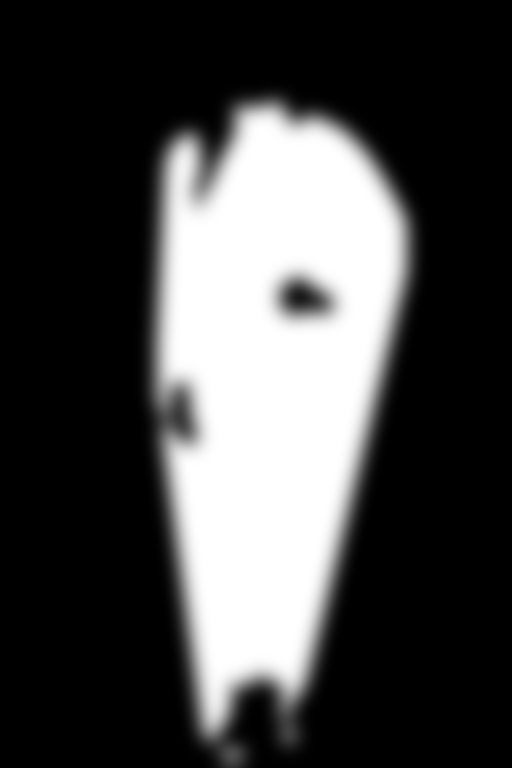

Running CatVTON on T4...


100%|██████████| 20/20 [00:12<00:00,  1.54it/s]


✅ TRY-ON COMPLETE
Saved: /content/drive/MyDrive/VTON/catvton_tryon.png


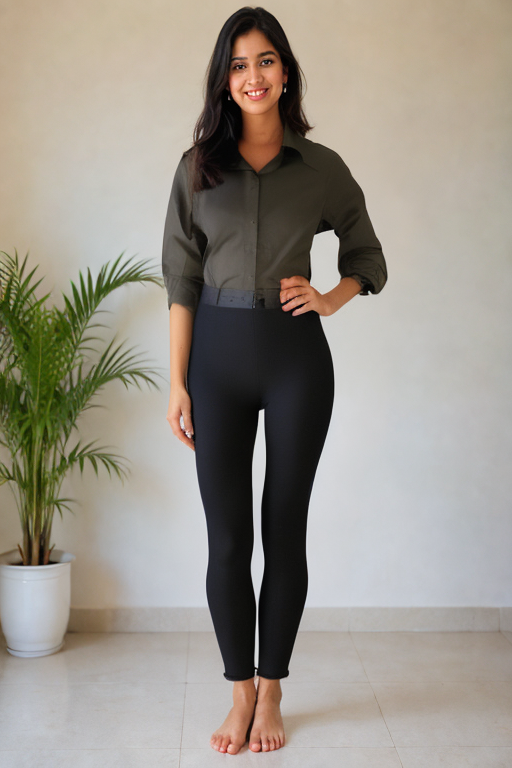

In [ ]:
from PIL import Image
from IPython.display import display
import torch

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

person = Image.open(person_path).convert("RGB")
saree = Image.open(saree_path).convert("RGB")

width = 512
height = 768

# Resize person
person = person.resize((width, height))

print("Person:", person.size)
print("Saree :", saree.size)

print("Creating overall clothing mask...")

mask_result = automasker(
    person,
    "overall"
)

mask = mask_result["mask"]

# Same mask processing used by CatVTON
mask = mask_processor.blur(mask, blur_factor=9)

print("✅ Mask generated:", mask.size)

display(mask)

print("Running CatVTON on T4...")

with torch.inference_mode():
    result = pipeline(
        image=person,
        condition_image=saree,
        mask=mask,
        num_inference_steps=20,
        guidance_scale=2.5,
        height=height,
        width=width,
    )

result_image = result[0]

output_path = "/content/drive/MyDrive/VTON/catvton_tryon.png"
result_image.save(output_path)

print("✅ TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

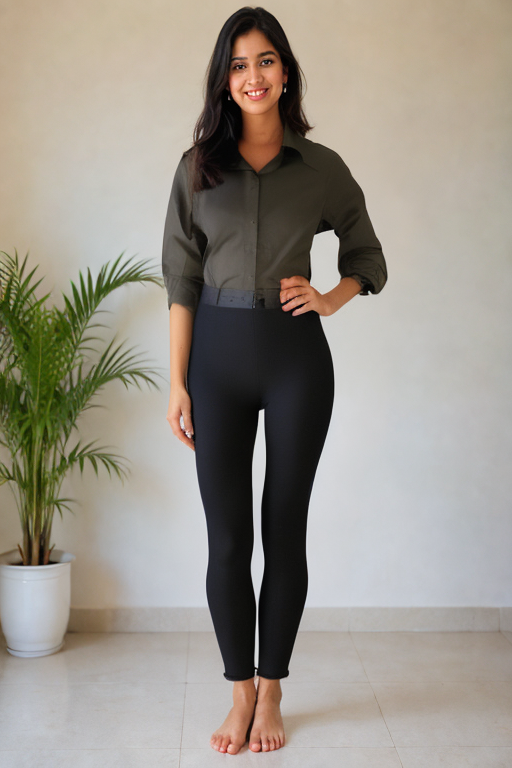

In [ ]:
from IPython.display import display
from PIL import Image

result_path = "/content/drive/MyDrive/VTON/catvton_tryon.png"

display(Image.open(result_path))

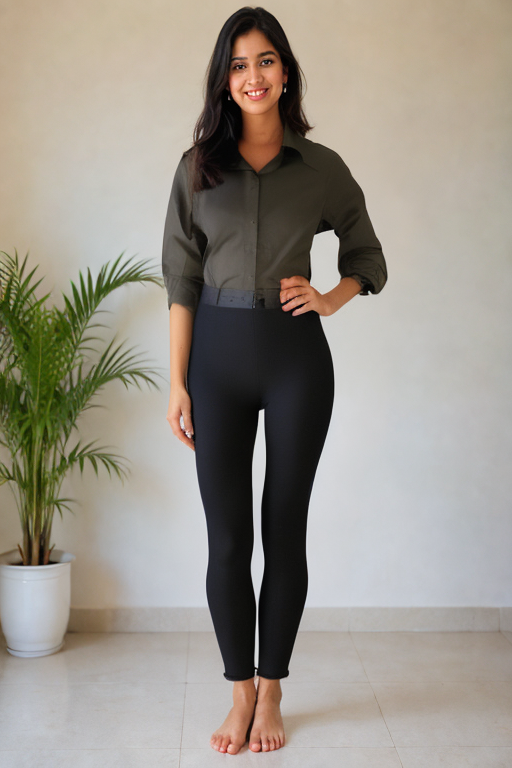

In [ ]:
from PIL import Image
from IPython.display import display

result = Image.open(
    "/content/drive/MyDrive/VTON/catvton_tryon.png"
)

display(result)

In [ ]:
import sys
import torch
from PIL import Image
from IPython.display import display

# FASHN package
sys.path.insert(0, "/content/fashn-vton-1.5/src")

from fashn_vton import TryOnPipeline

print("Loading FASHN VTON...")

fashn_pipeline = TryOnPipeline(
    weights_dir="/content/fashn-vton-1.5/weights",
    device="cuda"
)

print("✅ FASHN loaded")
print("GPU:", torch.cuda.get_device_name(0))

# Your images
person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

person = Image.open(person_path).convert("RGB")
saree = Image.open(saree_path).convert("RGB")

print("Person:", person.size)
print("Saree :", saree.size)

print("\nRunning FASHN VTON...")
print("Category: one-pieces")
print("Garment: flat-lay")
print("Steps: 30")

with torch.inference_mode():

    result = fashn_pipeline(
        person_image=person,
        garment_image=saree,

        # Closest FASHN category for a full saree
        category="one-pieces",

        # VERY IMPORTANT for your 600x600 product saree
        garment_photo_type="flat-lay",

        # Balanced quality
        num_samples=1,
        num_timesteps=30,

        guidance_scale=1.5,

        seed=42,

        segmentation_free=True
    )

result_image = result.images[0]

output_path = "/content/drive/MyDrive/VTON/fashn_saree_tryon.png"
result_image.save(output_path)

print("\n✅ FASHN TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

TryOnPipeline - INFO - Using device: cuda
TryOnPipeline - INFO - Using dtype: torch.bfloat16
TryOnPipeline - INFO - Loading TryOnModel from /content/fashn-vton-1.5/weights/model.safetensors


Loading FASHN VTON...


TryOnPipeline - INFO - TryOnModel loaded
TryOnPipeline - INFO - Loading DWPose from /content/fashn-vton-1.5/weights/dwpose
TryOnPipeline - INFO - DWPose loaded
TryOnPipeline - INFO - Loading FashnHumanParser


Loading weights:   0%|          | 0/930 [00:00<?, ?it/s]

TryOnPipeline - INFO - FashnHumanParser loaded


✅ FASHN loaded
GPU: Tesla T4
Person: (1086, 1448)
Saree : (600, 600)

Running FASHN VTON...
Category: one-pieces
Garment: flat-lay
Steps: 30


TryOnPipeline - INFO - Running inference with 30 timesteps...


Sampling:   0%|          | 0/30 [00:00<?, ?it/s]

OutOfMemoryError: CUDA out of memory. Tried to allocate 912.00 MiB. GPU 0 has a total capacity of 14.56 GiB of which 95.81 MiB is free. Including non-PyTorch memory, this process has 14.47 GiB memory in use. Of the allocated memory 13.10 GiB is allocated by PyTorch, and 1.23 GiB is reserved by PyTorch but unallocated. If reserved but unallocated memory is large try setting PYTORCH_CUDA_ALLOC_CONF=expandable_segments:True to avoid fragmentation.  See documentation for Memory Management  (https://docs.pytorch.org/docs/stable/notes/cuda.html#optimizing-memory-usage-with-pytorch-cuda-alloc-conf)

In [ ]:
import gc
import torch

print("GPU memory BEFORE cleanup:")
print(torch.cuda.memory_allocated() / 1024**3, "GB allocated")
print(torch.cuda.memory_reserved() / 1024**3, "GB reserved")

# Remove CatVTON objects
for name in ["pipeline", "automasker", "mask_processor"]:
    if name in globals():
        del globals()[name]

gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

print("\nGPU memory AFTER cleanup:")
print(torch.cuda.memory_allocated() / 1024**3, "GB allocated")
print(torch.cuda.memory_reserved() / 1024**3, "GB reserved")

GPU memory BEFORE cleanup:
5.714885234832764 GB allocated
14.333984375 GB reserved

GPU memory AFTER cleanup:
2.6213040351867676 GB allocated
3.884765625 GB reserved


Person: (1086, 1448)
Saree: (600, 600)
Running FASHN on T4...


TryOnPipeline - INFO - Running inference with 20 timesteps...


Sampling:   0%|          | 0/20 [00:00<?, ?it/s]

TryOnPipeline - INFO - Generated 1 images


✅ FASHN TRY-ON COMPLETE
Saved: /content/drive/MyDrive/VTON/fashn_saree_tryon.png


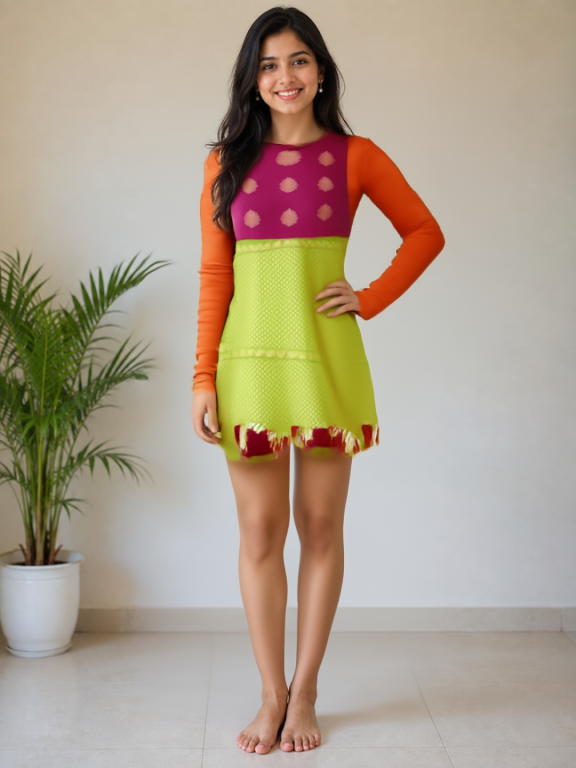

In [ ]:
from PIL import Image
from IPython.display import display
import torch

person = Image.open(
    "/content/drive/MyDrive/VTON/person.png"
).convert("RGB")

saree = Image.open(
    "/content/drive/MyDrive/VTON/saree.png"
).convert("RGB")

print("Person:", person.size)
print("Saree:", saree.size)
print("Running FASHN on T4...")

with torch.inference_mode():
    result = fashn_pipeline(
        person_image=person,
        garment_image=saree,
        category="one-pieces",
        garment_photo_type="flat-lay",
        num_samples=1,
        num_timesteps=20,
        guidance_scale=1.5,
        seed=42,
        segmentation_free=True,
    )

result_image = result.images[0]

output_path = "/content/drive/MyDrive/VTON/fashn_saree_tryon.png"
result_image.save(output_path)

print("✅ FASHN TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

Person: (1086, 1448)
Saree: (600, 600)
Running FASHN on T4...


TryOnPipeline - INFO - Running inference with 20 timesteps...


Sampling:   0%|          | 0/20 [00:00<?, ?it/s]

TryOnPipeline - INFO - Generated 1 images


✅ FASHN TRY-ON COMPLETE
Saved: /content/drive/MyDrive/VTON/fashn_saree_tryon.png


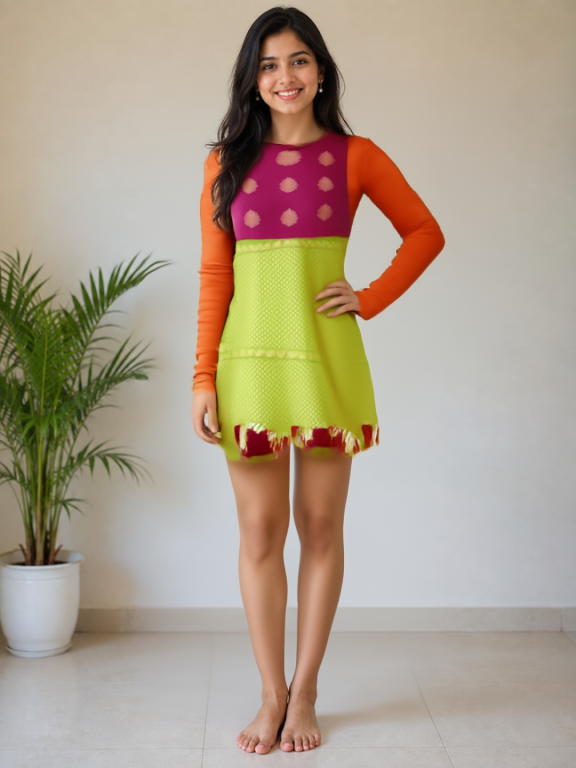

In [ ]:
from PIL import Image
from IPython.display import display
import torch

person = Image.open(
    "/content/drive/MyDrive/VTON/person.png"
).convert("RGB")

saree = Image.open(
    "/content/drive/MyDrive/VTON/saree.png"
).convert("RGB")

print("Person:", person.size)
print("Saree:", saree.size)
print("Running FASHN on T4...")

with torch.inference_mode():
    result = fashn_pipeline(
        person_image=person,
        garment_image=saree,
        category="one-pieces",
        garment_photo_type="flat-lay",
        num_samples=1,
        num_timesteps=20,
        guidance_scale=1.5,
        seed=42,
        segmentation_free=True,
    )

result_image = result.images[0]

output_path = "/content/drive/MyDrive/VTON/fashn_saree_tryon.png"
result_image.save(output_path)

print("✅ FASHN TRY-ON COMPLETE")
print("Saved:", output_path)

display(result_image)

In [ ]:
import os

print("RefTon files:")
for root, dirs, files in os.walk("/content/RefTon"):
    level = root.replace("/content/RefTon", "").count(os.sep)
    if level < 2:
        print("  " * level + os.path.basename(root) + "/")
        for f in files[:10]:
            print("  " * (level + 1) + f)

RefTon files:


In [ ]:
import os
import subprocess

repo = "/content/RefTon"

print("Checking RefTon...")

if not os.path.exists(repo):
    print("❌ RefTon folder does not exist")
else:
    print("✅ RefTon folder exists")

    print("\nContents:")
    result = subprocess.run(
        ["bash", "-lc", f"ls -lah {repo}"],
        capture_output=True,
        text=True
    )
    print(result.stdout)

    print("\nGit status:")
    result = subprocess.run(
        ["bash", "-lc", f"cd {repo} && git status --short --branch"],
        capture_output=True,
        text=True
    )
    print(result.stdout)

Checking RefTon...
❌ RefTon folder does not exist


In [ ]:
%cd /content

!rm -rf RefTon

!git clone --depth 1 https://github.com/360CVGroup/RefTon.git

print("\nChecking...")
!ls -lah /content/RefTon

/content
Cloning into 'RefTon'...
remote: Enumerating objects: 97, done.
remote: Counting objects: 100% (97/97), done.
remote: Compressing objects: 100% (93/93), done.
remote: Total 97 (delta 3), reused 90 (delta 3), pack-reused 0 (from 0)
Receiving objects: 100% (97/97), 7.46 MiB | 33.48 MiB/s, done.
Resolving deltas: 100% (3/3), done.

Checking...
total 124K
drwxr-xr-x 9 root root 4.0K Aug 16 20:56 .
drwxr-xr-x 1 root root 4.0K Aug 16 20:56 ..
-rw-r--r-- 1 root root  21K Aug 16 20:56 argparser.py
drwxr-xr-x 2 root root 4.0K Aug 16 20:56 assets
drwxr-xr-x 2 root root 4.0K Aug 16 20:56 config
drwxr-xr-x 2 root root 4.0K Aug 16 20:56 datasets_util
drwxr-xr-x 2 root root 4.0K Aug 16 20:56 evaluation
drwxr-xr-x 7 root root 4.0K Aug 16 20:56 example
drwxr-xr-x 8 root root 4.0K Aug 16 20:56 .git
-rw-r--r-- 1 root root   52 Aug 16 20:56 .gitignore
-rw-r--r-- 1 root root 8.0K Aug 16 20:56 inference.py
-rw-r--r-- 1 root root  11K Aug 16 20:56 README.md
drwxr-xr-x 4 root root 4.0K Aug 16 20:56 

In [ ]:
%cd /content/RefTon

print("Searching RefTon documentation for model/quantization options...\n")

!grep -RniE "quant|fp8|fp4|4bit|8bit|offload|cpu|VRAM|memory|huggingface" \
    README.md inference.py config refton 2>/dev/null | head -100

/content/RefTon
Searching RefTon documentation for model/quantization options...

README.md:3:[![Hugging Face](https://img.shields.io/badge/Hugging%20Face-RefTon-ff9900?style=flat)](https://huggingface.co/qihoo360/RefVTON) [![arXiv](https://img.shields.io/badge/arXiv-2511.00956-B31B1B?style=flat)](https://arxiv.org/abs/2511.00956)
README.md:11:- [2025.10.11] Release inference code and LoRA weights on [Hugging Face](https://huggingface.co/qihoo360/RefVTON).
README.md:14:- [2026.3.28] Release the training code and [VRF datasets](https://huggingface.co/datasets/qihoo360/VRF-datasets).
README.md:54:Download [FLUX.1-Kontext-dev](https://huggingface.co/black-forest-labs/FLUX.1-Kontext-dev) and pass its local path through `--pretrained_model_name_or_path`.
README.md:57:For inference, `--output_dir` is the LoRA weight path to load. It can be a `.safetensors` file or a checkpoint directory supported by `diffusers`. Our released LoRA weights are available in the [RefTon Hugging Face repository](

In [ ]:
print("\nInference arguments:")
!python inference.py --help | head -120


Inference arguments:
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v0.40.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
usage: inference.py [-h]
                    [--pretrained_model_name_or_path PRETRAINED_MODEL_NAME_OR_PATH]
                    [--revision REVISION] [--vae_encode_mode {sample,mode}]
                    [--variant VARIANT] [--dataset_name DATASET_NAME]
                    [--dataset_config_name DATASET_CONFIG_NAME]
                    [--instance_data_dir INSTANCE_DATA_DIR] [--use_person]
                    [--use_reference] [--use_different]
                    [--person_prob PERSON_PROB] [--split SPLIT]
                    [--cache_dir CACHE_DIR] [--image_column IMAGE_COLUMN]
                    [--cond_image_column COND_IMAGE_COLUMN]
                    [--caption

In [ ]:
%cd /content/RefTon

!grep -RniE "FluxPipeline|FluxKontext|Lora|lora|load_lora|from_pretrained|quant|8bit|4bit|cpu_offload|enable_model_cpu_offload" \
    refton example README.md 2>/dev/null | head -150

/content/RefTon
refton/pipelines/flux_kontext_i2i.py:22:    FluxLoraLoaderMixin,
refton/pipelines/flux_kontext_i2i.py:27:from diffusers.pipelines.flux.pipeline_output import FluxPipelineOutput
refton/pipelines/flux_kontext_i2i.py:35:    scale_lora_layers,
refton/pipelines/flux_kontext_i2i.py:36:    unscale_lora_layers,
refton/pipelines/flux_kontext_i2i.py:55:        >>> from refton.pipelines import FluxKontextPipelineI2I
refton/pipelines/flux_kontext_i2i.py:58:        >>> pipe = FluxKontextPipelineI2I.from_pretrained(
refton/pipelines/flux_kontext_i2i.py:153:class FluxKontextPipelineI2I(
refton/pipelines/flux_kontext_i2i.py:155:    FluxLoraLoaderMixin,
refton/pipelines/flux_kontext_i2i.py:160:    model_cpu_offload_seq = "text_encoder->text_encoder_2->image_encoder->transformer->vae"
refton/pipelines/flux_kontext_i2i.py:322:        lora_scale: Optional[float] = None,
refton/pipelines/flux_kontext_i2i.py:326:        if lora_scale is not None and isinstance(self, FluxLoraLoaderMixin):
ref

In [ ]:
%cd /content/RefTon

!sed -n '50,165p' README.md

/content/RefTon
- paths containing `DressCode` use the DressCode loader
- other paths use the custom in-the-wild loader

### Pretrained backbone
Download [FLUX.1-Kontext-dev](https://huggingface.co/black-forest-labs/FLUX.1-Kontext-dev) and pass its local path through `--pretrained_model_name_or_path`.

### LoRA weights
For inference, `--output_dir` is the LoRA weight path to load. It can be a `.safetensors` file or a checkpoint directory supported by `diffusers`. Our released LoRA weights are available in the [RefTon Hugging Face repository](https://huggingface.co/qihoo360/RefVTON).

### Custom folder layout
For custom inference, the repository expects a directory layout like:

```text
example/
├── agnostic/
├── cloth/
├── image_ref/
├── images/
└── person/
```

Notes:
- `cloth/` garment images, is always required.
- `agnostic/` target garment agnost images, is required when you do not use `--use_person`.
- `person/` target person wearing different garment, is required when you use `--

In [ ]:
%cd /content/RefTon

!mkdir -p /content/RefTon_weights

!huggingface-cli download \
    qihoo360/RefVTON \
    --local-dir /content/RefTon_weights

/content/RefTon

Hint: A new version of huggingface_hub (1.27.0) is available! You are using version 1.23.0.
To update, run: hf update
Hint: `hf` is already installed! Use it directly.

Hint: Examples:
  hf auth login
  hf download unsloth/gemma-4-31B-it-GGUF
  hf upload my-cool-model . .
  hf models ls --search "gemma"
  hf repos ls --format json
  hf jobs run python:3.12 python -c 'print("Hello!")'
  hf --help



In [ ]:
%cd /content/RefTon

!rm -rf /content/RefTon_weights
!mkdir -p /content/RefTon_weights

!hf download qihoo360/RefVTON \
    --local-dir /content/RefTon_weights

/content/RefTon
Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 7 files:   0% 0/7 [00:00<?, ?it/s]
Reconstructing (incomplete total...):   0% 0.00/388k [00:00<?, ?B/s]          
Reconstructing (incomplete total...):   0% 0.00/3.08M [00:00<?, ?B/s]
Reconstructing (incomplete total...):   0% 0.00/3.37M [00:00<?, ?B/s]
Reconstructing (incomplete total...):   0% 0.00/437M [00:00<?, ?B/s] 
Reconstructing (incomplete total...):   0% 0.00/870M [00:00<?, ?B/s]Warning: You are sending unauthenticated requests to the HF Hub. Please set a HF_TOKEN to enable higher rate limits and faster downloads.

Reconstructing (incomplete total...):   0% 0.00/870M [00:00<?, ?B/s]

Fetching 7 files:  14% 1/7 [00:00<00:01,  3.25it/s]
Reconstructing (incomplete total...):   0% 1.68k/870M [00:00<45:10:49, 5.35kB/s]
Reconstructing (incomplete total...):  18% 157M/870M [00:05<00:21, 32.6MB/s, 38.2kB/s  ]
Reconstructing (incomplete total...):  54% 468M/870M [00:06<00:04, 90.1M

In [ ]:
import os

print("RefTon files:")

for root, dirs, files in os.walk("/content/RefTon_weights"):
    for f in files:
        path = os.path.join(root, f)
        size = os.path.getsize(path) / (1024**2)
        print(f"✅ {path} — {size:.1f} MB")

RefTon files:
✅ /content/RefTon_weights/VITON_results.png — 0.4 MB
✅ /content/RefTon_weights/.gitattributes — 0.0 MB
✅ /content/RefTon_weights/README.md — 0.0 MB
✅ /content/RefTon_weights/512_384_pytorch_lora_weights.safetensors — 413.4 MB
✅ /content/RefTon_weights/1024_768_pytorch_lora_weights.safetensors — 413.4 MB
✅ /content/RefTon_weights/DressCode_results.png — 0.3 MB
✅ /content/RefTon_weights/examples.png — 2.6 MB
✅ /content/RefTon_weights/.cache/huggingface/CACHEDIR.TAG — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/.gitignore — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/512_384_pytorch_lora_weights.safetensors.lock — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/DressCode_results.png.lock — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/512_384_pytorch_lora_weights.safetensors.metadata — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/DressCode_results.png.metadata — 0.0 MB
✅ /content/RefTon_weights/.cache/huggi

In [ ]:
!df -h /content

Filesystem      Size  Used Avail Use% Mounted on
overlay         113G   58G   56G  51% /


In [ ]:
import os

print("RefTon weights:")

for root, dirs, files in os.walk("/content/RefTon_weights"):
    for f in files:
        path = os.path.join(root, f)
        size = os.path.getsize(path) / (1024**2)
        print(f"✅ {path} — {size:.1f} MB")

RefTon weights:
✅ /content/RefTon_weights/VITON_results.png — 0.4 MB
✅ /content/RefTon_weights/.gitattributes — 0.0 MB
✅ /content/RefTon_weights/README.md — 0.0 MB
✅ /content/RefTon_weights/512_384_pytorch_lora_weights.safetensors — 413.4 MB
✅ /content/RefTon_weights/1024_768_pytorch_lora_weights.safetensors — 413.4 MB
✅ /content/RefTon_weights/DressCode_results.png — 0.3 MB
✅ /content/RefTon_weights/examples.png — 2.6 MB
✅ /content/RefTon_weights/.cache/huggingface/CACHEDIR.TAG — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/.gitignore — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/512_384_pytorch_lora_weights.safetensors.lock — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/DressCode_results.png.lock — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/512_384_pytorch_lora_weights.safetensors.metadata — 0.0 MB
✅ /content/RefTon_weights/.cache/huggingface/download/DressCode_results.png.metadata — 0.0 MB
✅ /content/RefTon_weights/.cache/hug

In [ ]:
import torch
import diffusers
import transformers
import accelerate

print("Torch       :", torch.__version__)
print("Diffusers   :", diffusers.__version__)
print("Transformers:", transformers.__version__)
print("Accelerate  :", accelerate.__version__)
print("CUDA        :", torch.cuda.is_available())
print("GPU         :", torch.cuda.get_device_name(0))

try:
    from diffusers import FluxKontextPipeline
    print("✅ FluxKontextPipeline available")
except Exception as e:
    print("❌ FluxKontextPipeline:", e)

try:
    from diffusers import BitsAndBytesConfig
    print("✅ BitsAndBytesConfig available")
except Exception as e:
    print("❌ BitsAndBytesConfig:", e)

Torch       : 2.11.0+cu128
Diffusers   : 0.39.0
Transformers: 5.13.1
Accelerate  : 1.14.0
CUDA        : True
GPU         : Tesla T4
✅ FluxKontextPipeline available
✅ BitsAndBytesConfig available


In [ ]:
!pip install -q bitsandbytes

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.0/41.0 MB 25.6 MB/s eta 0:00:00


In [ ]:
import bitsandbytes as bnb
print("✅ bitsandbytes:", bnb.__version__)

✅ bitsandbytes: 0.50.1


In [ ]:
import gc
import torch

# Free old VTON models from GPU
for name in ["fashn_pipeline", "pipeline", "automasker"]:
    if name in globals():
        del globals()[name]

gc.collect()
torch.cuda.empty_cache()
torch.cuda.ipc_collect()

print("GPU:", torch.cuda.get_device_name(0))
print("Allocated:", round(torch.cuda.memory_allocated()/1024**3, 2), "GB")
print("Reserved :", round(torch.cuda.memory_reserved()/1024**3, 2), "GB")

GPU: Tesla T4
Allocated: 2.62 GB
Reserved : 3.88 GB


In [ ]:
%cd /content/RefTon

from refton.pipelines import FluxKontextPipelineI2I

print("✅ RefTon pipeline imported")

/content/RefTon
✅ RefTon pipeline imported


In [ ]:
import inspect
from refton.pipelines import FluxKontextPipelineI2I

print(inspect.signature(FluxKontextPipelineI2I.from_pretrained))

(pretrained_model_name_or_path: str | os.PathLike, **kwargs) -> Self


In [ ]:
import inspect
from refton.pipelines import FluxKontextPipelineI2I

print("INIT:")
print(inspect.signature(FluxKontextPipelineI2I.__init__))

print("\nFROM PRETRAINED:")
print(inspect.signature(FluxKontextPipelineI2I.from_pretrained))

INIT:
(self, scheduler: diffusers.schedulers.scheduling_flow_match_euler_discrete.FlowMatchEulerDiscreteScheduler, vae: diffusers.models.autoencoders.autoencoder_kl.AutoencoderKL, text_encoder: transformers.models.clip.modeling_clip.CLIPTextModel, tokenizer: transformers.models.clip.tokenization_clip.CLIPTokenizer, text_encoder_2: transformers.models.t5.modeling_t5.T5EncoderModel, tokenizer_2: transformers.models.t5.tokenization_t5.T5Tokenizer, transformer: diffusers.models.transformers.transformer_flux.FluxTransformer2DModel, image_encoder: transformers.models.clip.modeling_clip.CLIPVisionModelWithProjection = None, feature_extractor: transformers.models.clip.image_processing_clip.CLIPImageProcessor = None)

FROM PRETRAINED:
(pretrained_model_name_or_path: str | os.PathLike, **kwargs) -> Self


In [ ]:
INIT:
(self, scheduler: diffusers.schedulers.scheduling_flow_match_euler_discrete.FlowMatchEulerDiscreteScheduler, vae: diffusers.models.autoencoders.autoencoder_kl.AutoencoderKL, text_encoder: transformers.models.clip.modeling_clip.CLIPTextModel, tokenizer: transformers.models.clip.tokenization_clip.CLIPTokenizer, text_encoder_2: transformers.models.t5.modeling_t5.T5EncoderModel, tokenizer_2: transformers.models.t5.tokenization_t5.T5Tokenizer, transformer: diffusers.models.transformers.transformer_flux.FluxTransformer2DModel, image_encoder: transformers.models.clip.modeling_clip.CLIPVisionModelWithProjection = None, feature_extractor: transformers.models.clip.image_processing_clip.CLIPImageProcessor = None)

FROM PRETRAINED:
(pretrained_model_name_or_path: str | os.PathLike, **kwargs) -> Self


SyntaxError: invalid syntax (3056329379.py, line 1)

In [ ]:
import inspect
from refton.pipelines import FluxKontextPipelineI2I

print("INIT:")
print(inspect.signature(FluxKontextPipelineI2I.__init__))

print("\nFROM PRETRAINED:")
print(inspect.signature(FluxKontextPipelineI2I.from_pretrained))

INIT:
(self, scheduler: diffusers.schedulers.scheduling_flow_match_euler_discrete.FlowMatchEulerDiscreteScheduler, vae: diffusers.models.autoencoders.autoencoder_kl.AutoencoderKL, text_encoder: transformers.models.clip.modeling_clip.CLIPTextModel, tokenizer: transformers.models.clip.tokenization_clip.CLIPTokenizer, text_encoder_2: transformers.models.t5.modeling_t5.T5EncoderModel, tokenizer_2: transformers.models.t5.tokenization_t5.T5Tokenizer, transformer: diffusers.models.transformers.transformer_flux.FluxTransformer2DModel, image_encoder: transformers.models.clip.modeling_clip.CLIPVisionModelWithProjection = None, feature_extractor: transformers.models.clip.image_processing_clip.CLIPImageProcessor = None)

FROM PRETRAINED:
(pretrained_model_name_or_path: str | os.PathLike, **kwargs) -> Self


In [ ]:
%cd /content/RefTon

!sed -n '1,220p' inference.py

/content/RefTon
import os
import shutil

import torch
from refton.pipelines import FluxKontextPipelineI2I
from train_refton_lora import viton_collate_fn
from datasets_util.viton import VITONDataset
from datasets_util.dresscode import DressCodeDataset
from datasets_util.in_the_wild import MyDataset
from datasets_util.vivid import ViViDDataset
from PIL import Image
import numpy as np
from tqdm import tqdm
from accelerate import Accelerator
from torch.utils.data import DataLoader
import torch.distributed as dist


def save_tensor_as_png(tensor, filename="visualize"):
    tensor = tensor.detach().cpu()
    if tensor.min() < 0:
        tensor = (tensor + 1) / 2
    array = tensor.float().numpy()
    array = np.transpose(array, (1, 2, 0))
    array = (array * 255).clip(0, 255).astype(np.uint8)
    Image.fromarray(array).save(filename)


def copy_to_all(src_dir, all_dir):
    files = [f for f in os.listdir(src_dir) if os.path.isfile(os.path.join(src_dir, f))]

    for f in tqdm(files, desc="C

In [ ]:
%cd /content/RefTon

!sed -n '1,280p' datasets_util/in_the_wild.py

/content/RefTon
from torchvision import transforms
from torchvision.transforms import functional as TF
from PIL import Image
from torch.utils.data import Dataset
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torch, random, os


from pathlib import Path
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image


class MyDataset(Dataset):
    def __init__(
        self,
        data_root,
        size=(512, 384),
        instance_prompt = "",
        center_crop=False,
        scale=1.0,
    ):
        self.data_root = Path(data_root)
        self.size = size
        self.cond_size = [int(x // scale) for x in size]

        image_dir = self.data_root / "images"
        cloth_dir = self.data_root / "cloth"
        agnostic_dir = self.data_root / "agnostic"
        image_ref_dir = self.data_root / "image_ref"
        person_dir = self.data_root / "person"
        

        self.samples = sorted(
            [
        

!sed -n '1,180p' datasets_util/__init__.py 2>/dev/null || true

In [ ]:
%cd /content/RefTon

!ls -lah datasets_util

/content/RefTon
total 108K
drwxr-xr-x  3 root root 4.0K Aug 16 20:57 .
drwxr-xr-x 10 root root 4.0K Aug 16 20:57 ..
-rw-r--r--  1 root root  17K Aug 16 20:56 combined_loader.py
-rw-r--r--  1 root root  20K Aug 16 20:56 datasets_loader.py
-rw-r--r--  1 root root 5.1K Aug 16 20:56 datasets_PIL.py
-rw-r--r--  1 root root 7.0K Aug 16 20:56 dresscode.py
-rw-r--r--  1 root root 5.3K Aug 16 20:56 fashiontryon.py
-rw-r--r--  1 root root 4.6K Aug 16 20:56 igpairs.py
-rw-r--r--  1 root root 4.1K Aug 16 20:56 in_the_wild.py
drwxr-xr-x  2 root root 4.0K Aug 16 20:58 __pycache__
-rw-r--r--  1 root root 5.0K Aug 16 20:56 viton.py
-rw-r--r--  1 root root 4.8K Aug 16 20:56 vivid.py


In [ ]:
!cat datasets_util/in_the_wild.py

from torchvision import transforms
from torchvision.transforms import functional as TF
from PIL import Image
from torch.utils.data import Dataset
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torch, random, os


from pathlib import Path
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image


class MyDataset(Dataset):
    def __init__(
        self,
        data_root,
        size=(512, 384),
        instance_prompt = "",
        center_crop=False,
        scale=1.0,
    ):
        self.data_root = Path(data_root)
        self.size = size
        self.cond_size = [int(x // scale) for x in size]

        image_dir = self.data_root / "images"
        cloth_dir = self.data_root / "cloth"
        agnostic_dir = self.data_root / "agnostic"
        image_ref_dir = self.data_root / "image_ref"
        person_dir = self.data_root / "person"
        

        self.samples = sorted(
            [
                f.name
 

In [ ]:
from torchvision import transforms
from torchvision.transforms import functional as TF
from PIL import Image
from torch.utils.data import Dataset
from pathlib import Path
import matplotlib.pyplot as plt
import numpy as np
import torch, random, os


from pathlib import Path
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image


class MyDataset(Dataset):
    def __init__(
        self,
        data_root,
        size=(512, 384),
        instance_prompt = "",
        center_crop=False,
        scale=1.0,
    ):
        self.data_root = Path(data_root)
        self.size = size
        self.cond_size = [int(x // scale) for x in size]

        image_dir = self.data_root / "images"
        cloth_dir = self.data_root / "cloth"
        agnostic_dir = self.data_root / "agnostic"
        image_ref_dir = self.data_root / "image_ref"
        person_dir = self.data_root / "person"


        self.samples = sorted(
            [
                f.name
                for f in cloth_dir.iterdir()
                if f.suffix.lower() in [".jpg", ".png"]
            ]
        )

        # transforms
        crop_op = (
            transforms.CenterCrop(self.size)
            if center_crop
            else transforms.RandomCrop(self.size)
        )
        crop_cond_op = (
            transforms.CenterCrop(self.cond_size)
            if center_crop
            else transforms.RandomCrop(self.cond_size)
        )

        self.transform = transforms.Compose(
            [
                transforms.Resize(
                    self.size, interpolation=transforms.InterpolationMode.BILINEAR
                ),
                crop_op,
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )
        self.transform_cond = transforms.Compose(
            [
                transforms.Resize(
                    self.cond_size, interpolation=transforms.InterpolationMode.BILINEAR
                ),
                crop_cond_op,
                transforms.ToTensor(),
                transforms.Normalize([0.5], [0.5]),
            ]
        )

        self.image_dir = image_dir
        self.cloth_dir = cloth_dir
        self.agnostic_dir = agnostic_dir
        self.image_ref_dir = image_ref_dir
        self.person_dir = person_dir
        self.instance_prompt = instance_prompt

    def __len__(self):
        return len(self.samples)

    def load_image(self, directory, name, transform):
        path = directory / name
        if not path.exists():
            raise FileNotFoundError(f"Missing file: {path}")
        img = Image.open(path)
        if img.mode != "RGB":
            img = img.convert("RGB")
        return transform(img)

    def __getitem__(self, idx):
        name = self.samples[idx]

        example = {
            "cloth": self.load_image(self.cloth_dir, name, self.transform),
            "instance_prompt": self.instance_prompt,
            "index": str(name),
        }
        if os.path.exists(self.image_dir):
            example["image"] = self.load_image(self.image_dir, name, self.transform)
        if os.path.exists(self.agnostic_dir):
            example["agnostic"] = self.load_image(self.agnostic_dir, name, self.transform)
        if os.path.exists(self.image_ref_dir):
            example["image_ref"] = self.load_image(self.image_ref_dir, name, self.transform_cond)
        if os.path.exists(self.person_dir):
            example["person"] = self.load_image(self.person_dir, name, self.transform)
        return example




if __name__ == "__main__":
    from torch.utils.data import DataLoader
    dataset = MyDataset(
        data_root="test_image",
        size=(512, 384),
        center_crop=False,
        scale=1.0,
    )

    dataloader = DataLoader(dataset, batch_size=2, shuffle=True, num_workers=0)

    for i, batch in enumerate(dataloader):
        print(f"Batch {i}:")
        for k, v in batch.items():
            if hasattr(v, "shape"):
                print(f"  {k}: {v.shape}")
            else:
                print(f"  {k}: {v}")
        if i >= 1:
            break



FileNotFoundError: [Errno 2] No such file or directory: 'test_image/cloth'

In [ ]:
from pathlib import Path
import shutil

person_src = Path("/content/drive/MyDrive/VTON/person.png")
saree_src = Path("/content/drive/MyDrive/VTON/saree.png")

root = Path("/content/RefTon/my_saree")

# Create folders
for folder in ["cloth", "person", "image_ref", "images"]:
    (root / folder).mkdir(parents=True, exist_ok=True)

filename = "0001.png"

# Copy files
shutil.copy2(saree_src, root / "cloth" / filename)
shutil.copy2(person_src, root / "person" / filename)

# Temporary reference image
shutil.copy2(saree_src, root / "image_ref" / filename)

# Optional visualization
shutil.copy2(person_src, root / "images" / filename)

print("✅ RefTon dataset created")
print("Location:", root)

for folder in ["cloth", "person", "image_ref", "images"]:
    print(
        folder,
        "→",
        [x.name for x in (root / folder).iterdir()]
    )

✅ RefTon dataset created
Location: /content/RefTon/my_saree
cloth → ['0001.png']
person → ['0001.png']
image_ref → ['0001.png']
images → ['0001.png']


In [ ]:
import sys

sys.path.insert(0, "/content/RefTon")

from datasets_util.in_the_wild import MyDataset

dataset = MyDataset(
    data_root="/content/RefTon/my_saree",
    size=(512, 384),
    scale=1.0
)

print("✅ Dataset loaded")
print("Number of samples:", len(dataset))

sample = dataset[0]

print("\nSample:")
for key, value in sample.items():
    if hasattr(value, "shape"):
        print(key, value.shape)
    else:
        print(key, value)

✅ Dataset loaded
Number of samples: 1

Sample:
cloth torch.Size([3, 512, 384])
instance_prompt 
index 0001.png
image torch.Size([3, 512, 384])
image_ref torch.Size([3, 512, 384])
person torch.Size([3, 512, 384])


In [ ]:
import torch

print("GPU:", torch.cuda.get_device_name(0))
print("VRAM:", round(torch.cuda.get_device_properties(0).total_memory / 1024**3, 2), "GB")

!df -h /content

GPU: Tesla T4
VRAM: 14.56 GB
Filesystem      Size  Used Avail Use% Mounted on
overlay         113G   58G   56G  51% /


In [ ]:
%cd /content

!mkdir -p /content/FLUX-Kontext-dev

!hf download black-forest-labs/FLUX.1-Kontext-dev \
    --local-dir /content/FLUX-Kontext-dev

/content
Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 29 files:   0% 0/29 [00:00<?, ?it/s]
Reconstructing (incomplete total...):   0% 0.00/335M [00:00<?, ?B/s]          
Reconstructing (incomplete total...):   0% 0.00/341M [00:00<?, ?B/s]
Fetching 29 files:   0% 0/29 [00:00<?, ?it/s]

Reconstructing (incomplete total...):   0% 0.00/24.1G [00:00<?, ?B/s]
Reconstructing (incomplete total...):   0% 9.64k/24.1G [00:00<169:29:28, 39.6kB/s]Error: Access denied. This repository requires approval.
Hint: set HF_DEBUG=1 as environment variable for full traceback.
Reconstructing (incomplete total...):   0% 28.3k/24.1G [00:00<75:37:25, 88.7kB/s] 


In [ ]:
!hf auth login

? How would you like to log in?  [Use arrows, Enter to confirm]
> Log in with your browser
  Paste an access token
? How would you like to log in? Log in with your browser

    Open this URL in your browser:
        https://hf.co/oauth/device

    And enter the code: 5BOZ-NE2W

    Waiting for authorization......
Token is valid.
The token `oauth-VTRY` has been saved to /root/.cache/huggingface/stored_tokens
Your token has been saved to /root/.cache/huggingface/token
Login successful.
The current active token is: `oauth-VTRY`
Note: This token will be refreshed automatically when it expires.


In [ ]:
!rm -rf /content/FLUX-test

!hf download black-forest-labs/FLUX.1-Kontext-dev \
    --include "model_index.json" \
    --local-dir /content/FLUX-test

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

Fetching 1 files:   0% 0/1 [00:00<?, ?it/s]
Reconstructing (incomplete total...):   0% 0.00/688 [00:00<?, ?B/s]           

Fetching 1 files: 100% 1/1 [00:00<00:00,  5.36it/s]
Download complete: 100% 688/688 [00:00<00:00, 3.64kB/s]
Reconstruction complete: 100% 688/688 [00:00<00:00, 3.65kB/s]             ✓ Downloaded
  path: /content/FLUX-test
Download complete: 100% 688/688 [00:00<00:00, 3.18kB/s]
Reconstruction complete: 100% 688/688 [00:00<00:00, 3.18kB/s]


In [ ]:
!hf download black-forest-labs/FLUX.1-Kontext-dev \
    --dry-run

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

[dry-run] Fetching 29 files:   0% 0/29 [00:00<?, ?it/s]

[dry-run] Fetching 29 files:   7% 2/29 [00:00<00:01, 19.03it/s]

[dry-run] Fetching 29 files:  34% 10/29 [00:00<00:00, 53.92it/s]

[dry-run] Fetching 29 files:  69% 20/29 [00:00<00:00, 71.96it/s]

[dry-run] Fetching 29 files: 100% 29/29 [00:00<00:00, 63.60it/s]
Download complete: :           |  0.00B            
Reconstruction complete: |          |  0.00B /  0.00B                         [dry-run] Will download 29 files (out of 29) totalling 57.9G.
FILE                                                           SIZE  
-------------------------------------------------------------- ------
.gitattributes                                                 1.7K  
LICENSE.md                                                     18.6K 
README.md                                                      9.6K  
ae.safetensors                                             

In [ ]:
!hf download black-forest-labs/FLUX.1-Kontext-dev \
    --include "transformer/*" \
    --dry-run

Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

[dry-run] Fetching 5 files:   0% 0/5 [00:00<?, ?it/s]

[dry-run] Fetching 5 files: 100% 5/5 [00:00<00:00, 40.83it/s]
Download complete: :           |  0.00B            
Reconstruction complete: |          |  0.00B /  0.00B                         [dry-run] Will download 5 files (out of 5) totalling 23.8G.
FILE                                                           SIZE  
-------------------------------------------------------------- ------
transformer/config.json                                        452.0 
transformer/diffusion_pytorch_model-00001-of-00003.safetensors 10.0G 
transformer/diffusion_pytorch_model-00002-of-00003.safetensors 9.9G  
transformer/diffusion_pytorch_model-00003-of-00003.safetensors 3.9G  
transformer/diffusion_pytorch_model.safetensors.index.json     121.3K
Download complete: :           |  0.00B            
Reconstruction complete: |          |  0.00B /  0.00B            


In [ ]:
!hf models ls --search "FLUX.1-Kontext-dev" --limit 20

ID   CREATED_AT DOWNLOADS LIBRARY_NAME LIKES PIPELINE_TAG PRIVATE TAGS TRENDING_SCORE
---- ---------- --------- ------------ ----- ------------ ------- ---- --------------
b... 2025-05-28    237963 diffusers     2767 image-to-...         d...              4
b... 2025-06-25         0 diffusion...   101                      d...              0
C... 2025-06-25     79009 diffusion...   191                      d...              0
m... 2025-06-26       113                  1                      g...              0
b... 2025-06-26      2766 diffusion...   253 image-to-...         d...              0
Q... 2025-06-26     36044 gguf           156 image-to-...         g...              0
h... 2025-06-26         6 gguf             0                      g...              0
D... 2025-06-27      1391 diffusers       13 text-to-i...         d...              0
6... 2025-06-27      3394 diffusion...    40 image-to-...         d...              0
w... 2025-06-27         0                  5          

In [ ]:
!python - <<'PY'
from huggingface_hub import list_repo_files

repo = "black-forest-labs/FLUX.1-Kontext-dev"

files = list_repo_files(repo)

print("Transformer files:")
for f in files:
    if "transformer" in f.lower():
        print(f)
PY

/bin/bash: line 1: warning: here-document at line 1 delimited by end-of-file (wanted `PY')
Transformer files:
transformer/config.json
transformer/diffusion_pytorch_model-00001-of-00003.safetensors
transformer/diffusion_pytorch_model-00002-of-00003.safetensors
transformer/diffusion_pytorch_model-00003-of-00003.safetensors
transformer/diffusion_pytorch_model.safetensors.index.json


NameError: name 'PY' is not defined

In [ ]:
from huggingface_hub import list_models

print("Searching Hugging Face for quantized FLUX Kontext models...\n")

results = list_models(
    search="FLUX.1-Kontext-dev quantized",
    limit=20
)

for model in results:
    print(model.id)

Searching Hugging Face for quantized FLUX Kontext models...



In [ ]:
from huggingface_hub import list_models

print("\nSearching for FP8 FLUX Kontext models...\n")

results = list_models(
    search="FLUX Kontext FP8",
    limit=20
)

for model in results:
    print(model.id)


Searching for FP8 FLUX Kontext models...

AlekseyCalvin/Flux_Kontext_Dev_fp8_scaled_diffusers
6chan/flux1-kontext-dev-fp8
boricuapab/flux1-kontext-dev-fp8
AlekseyCalvin/flux1-kontext-dev_fp8_e4m3fn_diffusers
Sfinktah/flux1-kontext-dev_fp8e5m2_scaled
camenduru/flux1-kontext-dev_fp8_e4m3fn_diffusers
yeqiu168182/flux1-dev-kontext_fp8_scaled.safetensors
Cantina/Kontext_Flux_TRT_FP8
FangchenSad/FLUX.1-Kontext-dev-torchao-fp8


In [ ]:
from huggingface_hub import snapshot_download

repo = "AlekseyCalvin/Flux_Kontext_Dev_fp8_scaled_diffusers"

print("Checking FP8 model size...")
snapshot_download(
    repo_id=repo,
    local_dir="/content/flux-kontext-fp8",
    dry_run=True
)

Checking FP8 model size...


Reconstructing (incomplete total...): |          |  0.00B /  0.00B            

[dry-run] Fetching 30 files:   0%|          | 0/30 [00:00<?, ?it/s]

[DryRunFileInfo(commit_hash='652a3172b715103503a27193c3fed5d9cb5bc29c', file_size=540688, filename='ExamplesLoRas/overlays.png', local_path='/content/flux-kontext-fp8/ExamplesLoRas/overlays.png', is_cached=False, will_download=True),
 DryRunFileInfo(commit_hash='652a3172b715103503a27193c3fed5d9cb5bc29c', file_size=238786, filename='ExamplesLoRas/overlay.png', local_path='/content/flux-kontext-fp8/ExamplesLoRas/overlay.png', is_cached=False, will_download=True),
 DryRunFileInfo(commit_hash='652a3172b715103503a27193c3fed5d9cb5bc29c', file_size=1340867, filename='ExamplesLoRas/FuseIt.png', local_path='/content/flux-kontext-fp8/ExamplesLoRas/FuseIt.png', is_cached=False, will_download=True),
 DryRunFileInfo(commit_hash='652a3172b715103503a27193c3fed5d9cb5bc29c', file_size=2147614, filename='ExamplesLoRas/OldDamaged.png', local_path='/content/flux-kontext-fp8/ExamplesLoRas/OldDamaged.png', is_cached=False, will_download=True),
 DryRunFileInfo(commit_hash='652a3172b715103503a27193c3fed5d9cb5

In [ ]:
import inspect
from refton.pipelines import FluxKontextPipelineI2I

print("=== INIT ===")
print(inspect.signature(FluxKontextPipelineI2I.__init__))

print("\n=== FROM PRETRAINED ===")
print(inspect.signature(FluxKontextPipelineI2I.from_pretrained))

=== INIT ===
(self, scheduler: diffusers.schedulers.scheduling_flow_match_euler_discrete.FlowMatchEulerDiscreteScheduler, vae: diffusers.models.autoencoders.autoencoder_kl.AutoencoderKL, text_encoder: transformers.models.clip.modeling_clip.CLIPTextModel, tokenizer: transformers.models.clip.tokenization_clip.CLIPTokenizer, text_encoder_2: transformers.models.t5.modeling_t5.T5EncoderModel, tokenizer_2: transformers.models.t5.tokenization_t5.T5Tokenizer, transformer: diffusers.models.transformers.transformer_flux.FluxTransformer2DModel, image_encoder: transformers.models.clip.modeling_clip.CLIPVisionModelWithProjection = None, feature_extractor: transformers.models.clip.image_processing_clip.CLIPImageProcessor = None)

=== FROM PRETRAINED ===
(pretrained_model_name_or_path: str | os.PathLike, **kwargs) -> Self


In [ ]:
import inspect
from refton.pipelines import FluxKontextPipelineI2I

print(inspect.getsource(FluxKontextPipelineI2I.__init__))

    def __init__(
        self,
        scheduler: FlowMatchEulerDiscreteScheduler,
        vae: AutoencoderKL,
        text_encoder: CLIPTextModel,
        tokenizer: CLIPTokenizer,
        text_encoder_2: T5EncoderModel,
        tokenizer_2: T5TokenizerFast,
        transformer: FluxTransformer2DModel,
        image_encoder: CLIPVisionModelWithProjection = None,
        feature_extractor: CLIPImageProcessor = None,
    ):
        super().__init__()

        self.register_modules(
            vae=vae,
            text_encoder=text_encoder,
            text_encoder_2=text_encoder_2,
            tokenizer=tokenizer,
            tokenizer_2=tokenizer_2,
            transformer=transformer,
            scheduler=scheduler,
            image_encoder=image_encoder,
            feature_extractor=feature_extractor,
        )
        self.vae_scale_factor = (
            2 ** (len(self.vae.config.block_out_channels) - 1)
            if getattr(self, "vae", None)
            else 8
        )
  

In [ ]:
%cd /content/RefTon

import inspect
from refton.pipelines import FluxKontextPipelineI2I

print("CPU offload sequence:")
print(getattr(FluxKontextPipelineI2I, "model_cpu_offload_seq", None))

print("\nOffload methods:")
print("enable_model_cpu_offload:",
      hasattr(FluxKontextPipelineI2I, "enable_model_cpu_offload"))

print("enable_sequential_cpu_offload:",
      hasattr(FluxKontextPipelineI2I, "enable_sequential_cpu_offload"))

/content/RefTon
CPU offload sequence:
text_encoder->text_encoder_2->image_encoder->transformer->vae

Offload methods:
enable_model_cpu_offload: True
enable_sequential_cpu_offload: True


In [ ]:
%cd /content/RefTon

import inspect
from refton.pipelines import FluxKontextPipelineI2I

print("CPU offload sequence:")
print(getattr(FluxKontextPipelineI2I, "model_cpu_offload_seq", None))

print("\nOffload methods:")
print("enable_model_cpu_offload:",
      hasattr(FluxKontextPipelineI2I, "enable_model_cpu_offload"))

print("enable_sequential_cpu_offload:",
      hasattr(FluxKontextPipelineI2I, "enable_sequential_cpu_offload"))

/content/RefTon
CPU offload sequence:
text_encoder->text_encoder_2->image_encoder->transformer->vae

Offload methods:
enable_model_cpu_offload: True
enable_sequential_cpu_offload: True


In [ ]:
import inspect
from diffusers import FluxTransformer2DModel

print(inspect.signature(FluxTransformer2DModel.from_pretrained))

(pretrained_model_name_or_path: str | os.PathLike | None, **kwargs) -> Self


In [ ]:
import torch
print("BF16 supported:", torch.cuda.is_bf16_supported())
print("GPU:", torch.cuda.get_device_name(0))

BF16 supported: True
GPU: Tesla T4


In [ ]:
!pip install -q -U openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 41.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.4/94.4 kB 9.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 83.0/83.0 kB 8.3 MB/s eta 0:00:00


In [ ]:
import os
from getpass import getpass

os.environ["OPENAI_API_KEY"] = getpass("Paste your OpenAI API key: ")

print("✅ API key loaded")

Paste your OpenAI API key: ··········
✅ API key loaded


✅ Generation completed


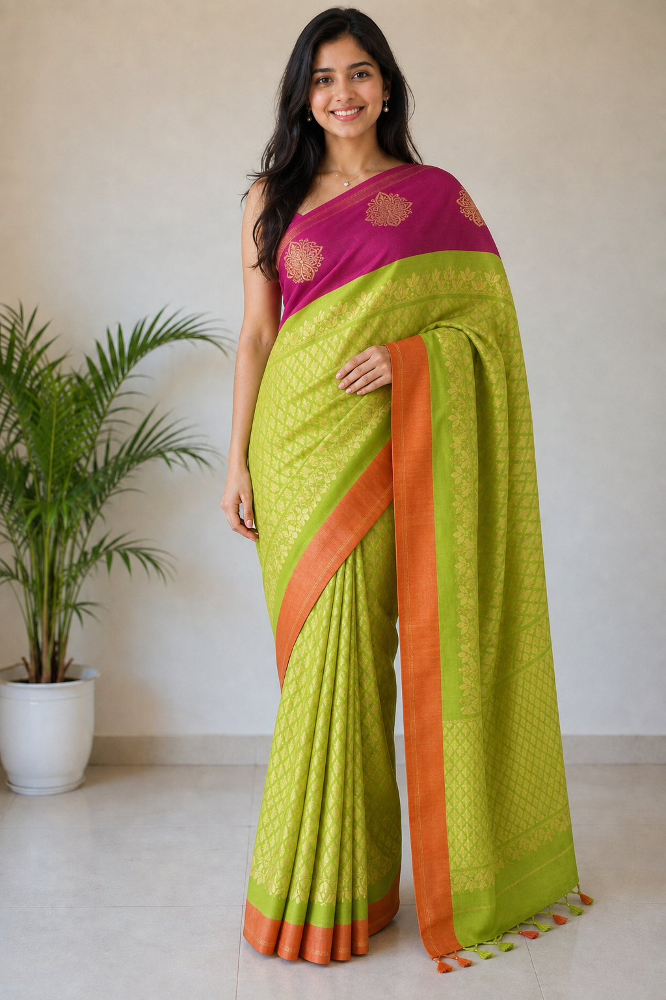

✅ Saved: /content/drive/MyDrive/VTON/openai_saree_tryon_01.png


In [ ]:
from openai import OpenAI
from IPython.display import display
from PIL import Image
import io
import base64

client = OpenAI()

prompt = """
Create a photorealistic virtual saree try-on.

Use the FIRST image as the exact target person.
Use the SECOND image as the exact saree garment reference.

Dress the same woman in the uploaded saree.

CRITICAL SAREE PRESERVATION REQUIREMENTS:
- Preserve the exact saree color and color combinations.
- Preserve the exact saree border.
- Preserve the exact motifs, embroidery, weaving and patterns.
- Preserve the exact pallu design and border.
- Do not redesign, simplify, recolor, replace, or invent the saree.
- Do not create a different saree.
- The uploaded saree is the source of truth for the garment appearance.

Create a realistic traditional Indian saree drape.
The saree should naturally wrap around the woman's body with realistic folds,
pleats, fabric tension and pallu placement.

Preserve the woman's:
- face
- identity
- hairstyle
- body proportions
- skin tone
- pose
- hands
- background

Only change the clothing to the uploaded saree.

Make the result look like a high-quality professional fashion photograph.
The saree should look physically worn rather than pasted onto the person.
"""

with open(person_path, "rb") as f1, open(saree_path, "rb") as f2:

    result = client.images.edit(
        model="gpt-image-2",
        image=[f1, f2],
        prompt=prompt,
        size="1024x1536",
        quality="medium",
    )

print("✅ Generation completed")

image_data = base64.b64decode(result.data[0].b64_json)
result_image = Image.open(io.BytesIO(image_data))

display(result_image)

output_path = "/content/drive/MyDrive/VTON/openai_saree_tryon_01.png"
result_image.save(output_path)

print("✅ Saved:", output_path)

In [ ]:
!pip install -q -U fastapi uvicorn python-multipart openai

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 kB 8.2 MB/s eta 0:00:00


In [ ]:
import os
from pathlib import Path

api_code = r'''
import os
import base64
import uuid
from pathlib import Path

from fastapi import FastAPI, UploadFile, File, HTTPException
from fastapi.responses import FileResponse
from openai import OpenAI

app = FastAPI(
    title="Saree Virtual Try-On API",
    version="1.0.0"
)

client = OpenAI(api_key=os.environ["OPENAI_API_KEY"])

OUTPUT_DIR = Path("/content/vton_outputs")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)


SAREE_PROMPT = """
Create a photorealistic virtual saree try-on.

IMAGE 1 is the TARGET PERSON.
IMAGE 2 is the EXACT SAREE supplied by the customer.

Dress the target person in the supplied saree.

The uploaded saree is the SOURCE OF TRUTH for the garment.

CRITICAL GARMENT FIDELITY:
- Preserve the exact saree colors.
- Preserve the exact color combinations.
- Preserve the exact border design.
- Preserve the exact pallu design.
- Preserve the exact motifs and decorative patterns.
- Preserve embroidery, weaving patterns and visible fabric texture.
- Do not redesign the saree.
- Do not substitute it with a similar saree.
- Do not invent a new saree pattern.
- Do not change the saree colors.
- Do not remove important borders or motifs.

DRAPING:
Create a realistic traditional Indian saree drape.
Generate natural pleats around the lower body.
Create realistic fabric folds and tension.
Place the pallu naturally over the shoulder.
Make the saree physically wrap around the person's body.

PERSON PRESERVATION:
Keep the same person's face, identity, hairstyle,
skin tone, body proportions and recognizable appearance.
Do not change the person's face.

Create a realistic professional fashion photograph.
The result should look like the person is actually wearing
the uploaded saree, not like a garment pasted onto the image.

Use the supplied saree image as the primary visual reference
for garment appearance.
"""


@app.get("/")
def root():
    return {
        "status": "online",
        "service": "Saree Virtual Try-On API",
        "version": "1.0"
    }


@app.post("/tryon")
async def tryon(
    person_image: UploadFile = File(...),
    saree_image: UploadFile = File(...)
):

    allowed = {
        "image/jpeg",
        "image/png",
        "image/webp"
    }

    if person_image.content_type not in allowed:
        raise HTTPException(
            status_code=400,
            detail="Person image must be JPG, PNG or WEBP"
        )

    if saree_image.content_type not in allowed:
        raise HTTPException(
            status_code=400,
            detail="Saree image must be JPG, PNG or WEBP"
        )

    request_id = uuid.uuid4().hex

    person_path = OUTPUT_DIR / f"{request_id}_person.png"
    saree_path = OUTPUT_DIR / f"{request_id}_saree.png"
    output_path = OUTPUT_DIR / f"{request_id}_tryon.png"

    person_data = await person_image.read()
    saree_data = await saree_image.read()

    person_path.write_bytes(person_data)
    saree_path.write_bytes(saree_data)

    try:
        with open(person_path, "rb") as person_file, \
             open(saree_path, "rb") as saree_file:

            result = client.images.edit(
                model="gpt-image-2",
                image=[person_file, saree_file],
                prompt=SAREE_PROMPT,
                size="1024x1536",
                quality="medium"
            )

        image_data = base64.b64decode(
            result.data[0].b64_json
        )

        output_path.write_bytes(image_data)

    except Exception as e:
        raise HTTPException(
            status_code=500,
            detail=f"Image generation failed: {str(e)}"
        )

    return {
        "success": True,
        "request_id": request_id,
        "image_url": f"/result/{request_id}"
    }


@app.get("/result/{request_id}")
def get_result(request_id: str):

    output_path = OUTPUT_DIR / f"{request_id}_tryon.png"

    if not output_path.exists():
        raise HTTPException(
            status_code=404,
            detail="Result not found"
        )

    return FileResponse(
        output_path,
        media_type="image/png"
    )
'''

Path("/content/saree_api.py").write_text(api_code)

print("✅ API created:")
print("/content/saree_api.py")

✅ API created:
/content/saree_api.py


In [ ]:
import subprocess
import time

process = subprocess.Popen(
    [
        "uvicorn",
        "saree_api:app",
        "--host", "0.0.0.0",
        "--port", "8000"
    ],
    cwd="/content"
)

time.sleep(3)

print("✅ Saree API started")
print("http://127.0.0.1:8000")

✅ Saree API started
http://127.0.0.1:8000


Result: (1024, 1536)


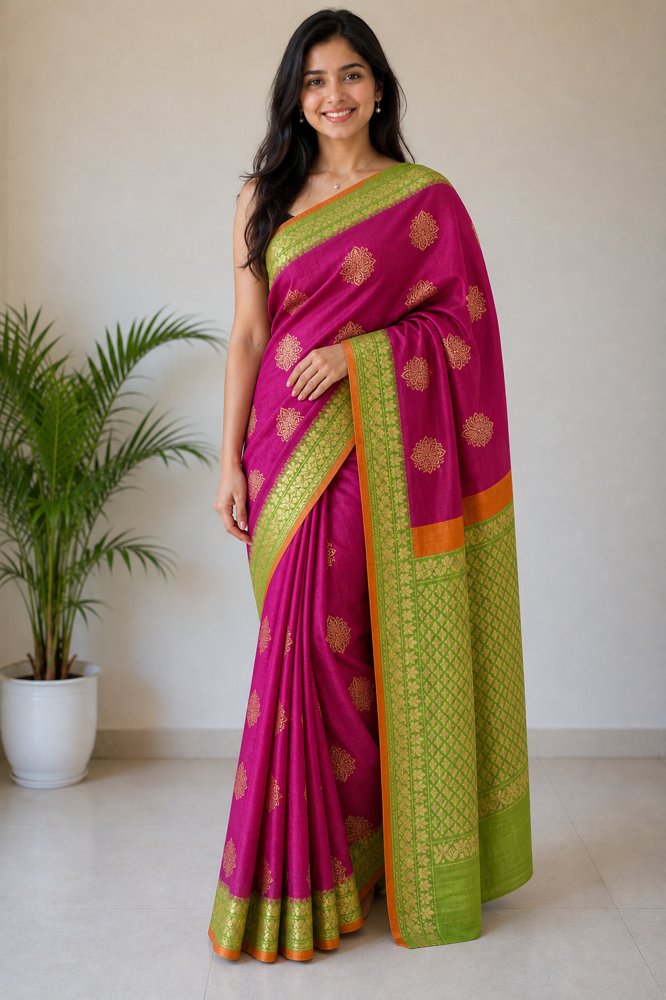

In [ ]:
from PIL import Image
from IPython.display import display

output_path = "/content/vton_outputs/dfa2ec7d7a1c471b9c0fb437380180b6_tryon.png"

result_image = Image.open(output_path)

print("Result:", result_image.size)
display(result_image)

In [ ]:
from pathlib import Path

api_code = r'''
import os
import base64
import uuid
from pathlib import Path

from fastapi import FastAPI, UploadFile, File, HTTPException
from fastapi.responses import FileResponse
from openai import OpenAI

app = FastAPI(
    title="Saree Virtual Try-On API",
    version="1.1.0"
)

client = OpenAI(api_key=os.environ["OPENAI_API_KEY"])

OUTPUT_DIR = Path("/content/vton_outputs")
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

MAX_FILE_SIZE = 10 * 1024 * 1024  # 10 MB


SAREE_PROMPT = """
Create a highly photorealistic Indian saree virtual try-on.

SOURCE IMAGES:
IMAGE 1 = TARGET PERSON.
IMAGE 2 = CUSTOMER'S EXACT SAREE.

The person in IMAGE 1 must remain the same person.
The saree in IMAGE 2 must be used as the garment.

GARMENT FIDELITY IS THE HIGHEST PRIORITY.

Treat IMAGE 2 as the authoritative visual reference for the saree.

Preserve as accurately as possible:
1. Exact saree base colors.
2. Exact color combinations.
3. Saree border colors and width.
4. Border motifs and decorative elements.
5. Pallu colors and design.
6. Repeated motifs and their visual style.
7. Embroidery/weaving appearance.
8. Fabric texture and sheen.
9. Decorative patterns.
10. Overall saree identity.

Do NOT:
- invent a different saree
- redesign the saree
- simplify the saree
- change its colors
- replace the border
- replace the pallu
- create a similar-looking commercial saree
- add unrelated patterns
- remove important decorative elements

The generated saree should clearly look like the customer's uploaded saree.

DRAPING:
Dress the target person in a traditional Indian saree.
Create realistic saree pleats.
Create natural fabric folds.
Create realistic fabric tension around the body.
Place the pallu naturally over the shoulder.
Make the saree physically conform to the person's body.

PERSON:
Preserve the target person's:
- face
- identity
- hairstyle
- skin tone
- body proportions
- hands
- pose
- overall appearance

Do not alter the person's identity.

Keep the original environment and photographic style when possible.

QUALITY:
Create a high-end professional fashion photograph.
Use realistic lighting, shadows, fabric folds and garment-body interaction.
The saree must look physically worn, not digitally pasted.

The final image should be a realistic photograph of the same person
wearing the customer's uploaded saree.
"""


def validate_image(upload: UploadFile):

    allowed = {
        "image/jpeg",
        "image/png",
        "image/webp"
    }

    if upload.content_type not in allowed:
        raise HTTPException(
            status_code=400,
            detail="Only JPG, PNG and WEBP images are supported."
        )


@app.get("/")
def root():
    return {
        "success": True,
        "service": "Saree Virtual Try-On API",
        "version": "1.1.0"
    }


@app.get("/health")
def health():
    return {
        "status": "healthy"
    }


@app.post("/api/v1/tryon")
async def tryon(
    person_image: UploadFile = File(...),
    saree_image: UploadFile = File(...)
):

    validate_image(person_image)
    validate_image(saree_image)

    person_data = await person_image.read()
    saree_data = await saree_image.read()

    if len(person_data) > MAX_FILE_SIZE:
        raise HTTPException(
            status_code=413,
            detail="Person image is larger than 10 MB."
        )

    if len(saree_data) > MAX_FILE_SIZE:
        raise HTTPException(
            status_code=413,
            detail="Saree image is larger than 10 MB."
        )

    request_id = uuid.uuid4().hex

    person_path = OUTPUT_DIR / f"{request_id}_person.png"
    saree_path = OUTPUT_DIR / f"{request_id}_saree.png"
    output_path = OUTPUT_DIR / f"{request_id}_tryon.png"

    person_path.write_bytes(person_data)
    saree_path.write_bytes(saree_data)

    try:

        with open(person_path, "rb") as person_file, \
             open(saree_path, "rb") as saree_file:

            result = client.images.edit(
                model="gpt-image-2",
                image=[person_file, saree_file],
                prompt=SAREE_PROMPT,
                size="1024x1536",
                quality="medium"
            )

        if not result.data:
            raise RuntimeError("OpenAI returned no image.")

        image_data = base64.b64decode(
            result.data[0].b64_json
        )

        output_path.write_bytes(image_data)

    except Exception as e:

        raise HTTPException(
            status_code=500,
            detail=f"Try-on generation failed: {str(e)}"
        )

    finally:

        if person_path.exists():
            person_path.unlink()

        if saree_path.exists():
            saree_path.unlink()

    return {
        "success": True,
        "request_id": request_id,
        "result_url": f"/api/v1/result/{request_id}"
    }


@app.get("/api/v1/result/{request_id}")
def get_result(request_id: str):

    output_path = OUTPUT_DIR / f"{request_id}_tryon.png"

    if not output_path.exists():
        raise HTTPException(
            status_code=404,
            detail="Try-on result not found."
        )

    return FileResponse(
        output_path,
        media_type="image/png"
    )
'''

Path("/content/saree_api_v2.py").write_text(api_code)

print("✅ New production-style API created")
print("/content/saree_api_v2.py")

✅ New production-style API created
/content/saree_api_v2.py


In [ ]:
process.terminate()
process.wait()

print("✅ Old API stopped")

✅ Old API stopped


In [ ]:
import requests
from PIL import Image
from IPython.display import display

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = requests.post(
        "http://127.0.0.1:8000/api/v1/tryon",
        files={
            "person_image": (
                "person.png",
                person_file,
                "image/png"
            ),
            "saree_image": (
                "saree.png",
                saree_file,
                "image/png"
            )
        },
        timeout=600
    )

print("Status:", response.status_code)
print(response.text)

Status: 200
{"success":true,"request_id":"5e08879a5815498798837ba85bdb7eb8","result_url":"/api/v1/result/5e08879a5815498798837ba85bdb7eb8"}


In [ ]:
process.terminate()
process.wait()

print("✅ Old API stopped")

✅ Old API stopped


In [ ]:
import subprocess
import time

process = subprocess.Popen(
    [
        "uvicorn",
        "saree_api_v2:app",
        "--host", "0.0.0.0",
        "--port", "8000"
    ],
    cwd="/content"
)

time.sleep(3)

print("✅ New Saree API started")
print("http://127.0.0.1:8000")

✅ New Saree API started
http://127.0.0.1:8000


In [ ]:
import subprocess
import time

process = subprocess.Popen(
    [
        "uvicorn",
        "saree_api_v2:app",
        "--host", "0.0.0.0",
        "--port", "8000"
    ],
    cwd="/content"
)

time.sleep(3)

print("✅ New Saree API started")
print("http://127.0.0.1:8000")

✅ New Saree API started
http://127.0.0.1:8000


In [ ]:
import requests

r = requests.get("http://127.0.0.1:8000/health")

print("Status:", r.status_code)
print("Response:", r.json())

Status: 200
Response: {'status': 'healthy'}


In [ ]:
import requests
from PIL import Image
from IPython.display import display

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = requests.post(
        "http://127.0.0.1:8000/api/v1/tryon",
        files={
            "person_image": (
                "person.png",
                person_file,
                "image/png"
            ),
            "saree_image": (
                "saree.png",
                saree_file,
                "image/png"
            )
        },
        timeout=600
    )

print("Status:", response.status_code)
print(response.text)

Status: 200
{"success":true,"request_id":"2a19085d22d2430397bf4aded7213c5e","result_url":"/api/v1/result/2a19085d22d2430397bf4aded7213c5e"}


Result size: (1024, 1536)


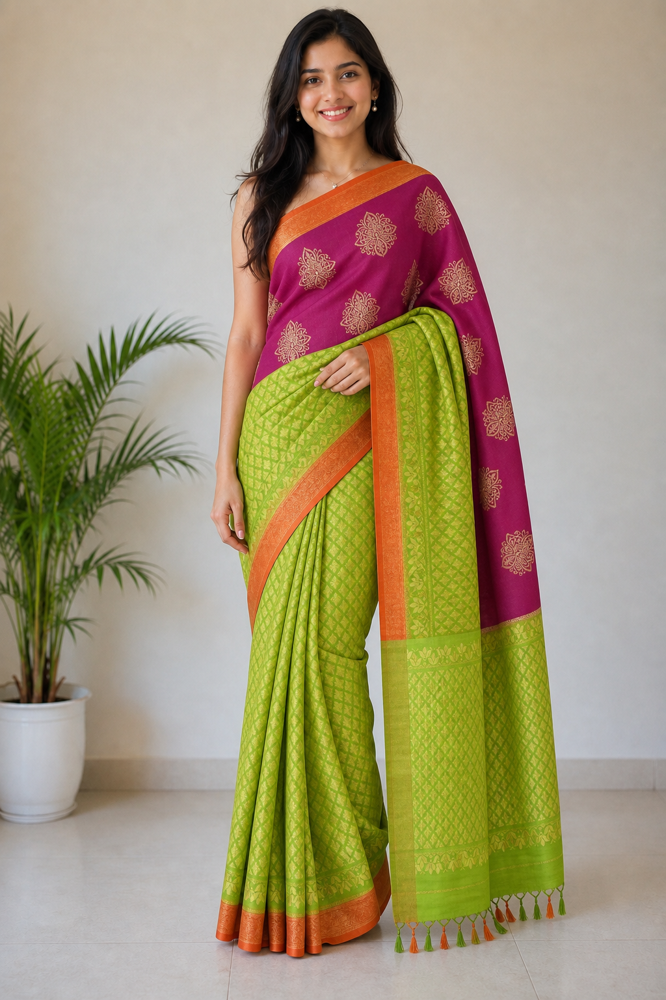

In [ ]:
from PIL import Image
from IPython.display import display

request_id = "2a19085d22d2430397bf4aded7213c5e"

output_path = f"/content/vton_outputs/{request_id}_tryon.png"

result = Image.open(output_path)

print("Result size:", result.size)
display(result)

In [ ]:
!pip install -q pyngrok

In [ ]:
import pyngrok

print("✅ pyngrok installed")
print("Version:", pyngrok.__version__)

✅ pyngrok installed
Version: 8.1.2


In [ ]:
import pyngrok

print("✅ pyngrok installed")
print("Version:", pyngrok.__version__)

✅ pyngrok installed
Version: 8.1.2


In [ ]:
from pyngrok import ngrok

# Close any previous tunnels
ngrok.kill()

public_url = ngrok.connect(8000)

print("🚀 PUBLIC API URL:")
print(public_url)

ERROR:pyngrok.process.ngrok:t=2026-08-16T22:06:08+0000 lvl=eror msg="failed to reconnect session" obj=tunnels.session err="authentication failed: This ngrok session is not authenticated. ngrok requires an account and a valid credential to start a session.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nGet your credential: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"
ERROR:pyngrok.process.ngrok:t=2026-08-16T22:06:08+0000 lvl=eror msg="session closing" obj=tunnels.session err="authentication failed: This ngrok session is not authenticated. ngrok requires an account and a valid credential to start a session.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nGet your credential: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"
CRITICAL:pyngrok.process.ngrok:t=2026-08-16T22:06:08+0000 lvl=crit msg="command failed" err="authentication failed: This ngrok session is not authenticated. ngrok requi

PyngrokNgrokError: The ngrok process errored on start: authentication failed: This ngrok session is not authenticated. ngrok requires an account and a valid credential to start a session.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nGet your credential: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n.

In [ ]:
import requests

try:
    r = requests.get("http://127.0.0.1:8000/health", timeout=5)
    print("✅ FastAPI:", r.status_code)
    print(r.json())
except Exception as e:
    print("❌ FastAPI is not running:")
    print(e)

✅ FastAPI: 200
{'status': 'healthy'}


In [ ]:
import requests

try:
    r = requests.get("http://127.0.0.1:8000/health", timeout=5)
    print("✅ FastAPI:", r.status_code)
    print(r.json())
except Exception as e:
    print("❌ FastAPI is not running:")
    print(e)

✅ FastAPI: 200
{'status': 'healthy'}


In [ ]:
import requests

try:
    r = requests.get("http://127.0.0.1:8000/health", timeout=5)
    print("✅ FastAPI:", r.status_code)
    print(r.json())
except Exception as e:
    print("❌ FastAPI is not running:")
    print(e)

✅ FastAPI: 200
{'status': 'healthy'}


In [ ]:
from pyngrok import ngrok

print("Active tunnels:")

for tunnel in ngrok.get_tunnels():
    print(tunnel.public_url, "->", tunnel.config.get("addr"))

Active tunnels:


ERROR:pyngrok.process.ngrok:t=2026-08-16T22:08:53+0000 lvl=eror msg="failed to reconnect session" obj=tunnels.session err="authentication failed: This ngrok session is not authenticated. ngrok requires an account and a valid credential to start a session.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nGet your credential: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"
ERROR:pyngrok.process.ngrok:t=2026-08-16T22:08:53+0000 lvl=eror msg="session closing" obj=tunnels.session err="authentication failed: This ngrok session is not authenticated. ngrok requires an account and a valid credential to start a session.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nGet your credential: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n"


PyngrokNgrokError: The ngrok process errored on start: authentication failed: This ngrok session is not authenticated. ngrok requires an account and a valid credential to start a session.\n\nSign up for an account: https://dashboard.ngrok.com/signup\nGet your credential: https://dashboard.ngrok.com/get-started/your-authtoken\r\n\r\nERR_NGROK_4018\r\n.

In [ ]:
from pyngrok import ngrok

NGROK_TOKEN = input("3I13KGlLQn2fbQuivTsR47GAzzv_3HNhhsik3x8m4Fbra2k6j: ")

ngrok.set_auth_token(NGROK_TOKEN)

print("✅ ngrok authenticated")

3I13KGlLQn2fbQuivTsR47GAzzv_3HNhhsik3x8m4Fbra2k6j: 3I13KGlLQn2fbQuivTsR47GAzzv_3HNhhsik3x8m4Fbra2k6j
✅ ngrok authenticated


In [ ]:
from pyngrok import ngrok

ngrok.kill()

tunnel = ngrok.connect(8000, "http")

print("🚀 PUBLIC API:")
print(tunnel.public_url)

🚀 PUBLIC API:
https://precinct-debtless-snore.ngrok-free.dev


In [ ]:
import requests

PUBLIC_URL = "https://precinct-debtless-snore.ngrok-free.dev"

person_path = "/content/drive/MyDrive/VTON/person.png"
saree_path = "/content/drive/MyDrive/VTON/saree.png"

with open(person_path, "rb") as person_file, \
     open(saree_path, "rb") as saree_file:

    response = requests.post(
        PUBLIC_URL + "/api/v1/tryon",
        files={
            "person_image": (
                "person.png",
                person_file,
                "image/png"
            ),
            "saree_image": (
                "saree.png",
                saree_file,
                "image/png"
            )
        },
        timeout=600
    )

print("Status:", response.status_code)
print(response.text)

Status: 200
{"success":true,"request_id":"c67e1608d7474360bbcd69da54ab0a9e","result_url":"/api/v1/result/c67e1608d7474360bbcd69da54ab0a9e"}


In [ ]:
# Backup API code
import shutil, os

os.makedirs("/content/drive/MyDrive/VTON/api_backup", exist_ok=True)

shutil.copy2(
    "/content/saree_api_v2.py",
    "/content/drive/MyDrive/VTON/api_backup/saree_api_v2.py"
)

print("✅ API code backed up")

✅ API code backed up


In [ ]:
print("✅ Colab is running")
print("Python:", __import__("sys").version)

✅ Colab is running
Python: 3.12.13 (main, Mar  4 2026, 09:23:07) [GCC 11.4.0]


In [ ]:
# Check whether the VTON pipeline is still available
try:
    pipeline
    print("✅ VTON pipeline is loaded")
except NameError:
    print("⚠️ VTON pipeline is NOT loaded")

⚠️ VTON pipeline is NOT loaded


In [ ]:
import sys
sys.path.insert(0, "/content/fashn-vton-1.5/src")

from fashn_vton import TryOnPipeline

pipeline = TryOnPipeline(
    model_name="fashn_vton",
)

print("✅ VTON pipeline restored")

ModuleNotFoundError: No module named 'fashn_vton'

In [ ]:
import os

print("📁 /content contents:")
print(os.listdir("/content"))

print("\n📁 fashn-vton folder exists:")
print(os.path.exists("/content/fashn-vton-1.5"))

if os.path.exists("/content/fashn-vton-1.5"):
    print("\n📁 fashn-vton-1.5 contents:")
    print(os.listdir("/content/fashn-vton-1.5")[:30])

📁 /content contents:
['.config', 'sample_data']

📁 fashn-vton folder exists:
False


In [ ]:
!git clone https://github.com/fashn-AI/fashn-vton-1.5.git /content/fashn-vton-1.5

Cloning into '/content/fashn-vton-1.5'...
remote: Enumerating objects: 92, done.
remote: Counting objects: 100% (25/25), done.
remote: Compressing objects: 100% (12/12), done.
remote: Total 92 (delta 20), reused 13 (delta 13), pack-reused 67 (from 1)
Receiving objects: 100% (92/92), 334.44 KiB | 864.00 KiB/s, done.
Resolving deltas: 100% (29/29), done.


In [ ]:
import os

print("Folder exists:", os.path.exists("/content/fashn-vton-1.5"))
print("Project files:", os.listdir("/content/fashn-vton-1.5")[:20])

Folder exists: True
Project files: ['tests', 'scripts', 'README.md', 'pyproject.toml', 'examples', '.gitignore', 'LICENSE', '.git', 'src']


In [ ]:
%cd /content/fashn-vton-1.5
!pip install -e .

/content/fashn-vton-1.5
Obtaining file:///content/fashn-vton-1.5
  Installing build dependencies ... done
  Checking if build backend supports build_editable ... done
  Getting requirements to build editable ... done
  Preparing editable metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 249.8/249.8 MB 4.4 MB/s eta 0:00:00
  Building editable for fashn-vton (pyproject.toml) ... done
  Created wheel for fashn-vton: filename=fashn_vton-1.5.0-0.editable-py3-none-any.whl size=5771 sha256=30c47a7c6eb6c99d531200c75d9f00b825d621b4b28302177ea6163176b8bcf3
  Stored in directory: /tmp/pip-ephem-wheel-cache-_3sgx628/wheels/83/85/d4/003a2789df48fea4fd69c5093b73b4495d75e045a364d41756
Successfully built fashn-vton


In [ ]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
else:
    print("⚠️ No CUDA GPU detected")

from fashn_vton import TryOnPipeline
print("✅ FASHN VTON import SUCCESS")

PyTorch: 2.11.0+cpu
CUDA available: False
⚠️ No CUDA GPU detected


ModuleNotFoundError: No module named 'fashn_vton'

In [ ]:
import os
import glob

print("=== src folder ===")
for x in glob.glob("/content/fashn-vton-1.5/src/*"):
    print(x)

print("\n=== Python package folders ===")
for root, dirs, files in os.walk("/content/fashn-vton-1.5/src"):
    for d in dirs:
        if "__pycache__" not in d:
            print(os.path.join(root, d))

=== src folder ===
/content/fashn-vton-1.5/src/fashn_vton
/content/fashn-vton-1.5/src/fashn_vton.egg-info

=== Python package folders ===
/content/fashn-vton-1.5/src/fashn_vton
/content/fashn-vton-1.5/src/fashn_vton.egg-info
/content/fashn-vton-1.5/src/fashn_vton/preprocessing
/content/fashn-vton-1.5/src/fashn_vton/dwpose
/content/fashn-vton-1.5/src/fashn_vton/utils


In [ ]:
import sys
import os

FASHN_SRC = "/content/fashn-vton-1.5/src"

if FASHN_SRC not in sys.path:
    sys.path.insert(0, FASHN_SRC)

print("Python:", sys.executable)
print("FASHN source exists:", os.path.exists(FASHN_SRC))
print("In sys.path:", FASHN_SRC in sys.path)

from fashn_vton import TryOnPipeline

print("✅ FASHN VTON IMPORT SUCCESS")
print("TryOnPipeline:", TryOnPipeline)

Python: /usr/bin/python3
FASHN source exists: True
In sys.path: True


ModuleNotFoundError: No module named 'fashn_vton'

In [ ]:
import sys
import os

FASHN_SRC = "/content/fashn-vton-1.5/src"

if FASHN_SRC not in sys.path:
    sys.path.insert(0, FASHN_SRC)

print("Python:", sys.executable)
print("FASHN source exists:", os.path.exists(FASHN_SRC))
print("In sys.path:", FASHN_SRC in sys.path)

from fashn_vton import TryOnPipeline

print("✅ FASHN VTON IMPORT SUCCESS")
print("TryOnPipeline:", TryOnPipeline)

Python: /usr/bin/python3
FASHN source exists: True
In sys.path: True


ModuleNotFoundError: No module named 'fashn_vton'

In [ ]:
print("TEST 123")

TEST 123


In [ ]:
import sys
import os

FASHN_SRC = "/content/fashn-vton-1.5/src"
sys.path.insert(0, FASHN_SRC)

print("Python:", sys.executable)
print("Source exists:", os.path.exists(FASHN_SRC))
print("sys.path OK:", FASHN_SRC in sys.path)

import fashn_vton

print("✅ fashn_vton module imported")
print("Module location:", fashn_vton.__file__)

print("\nAvailable names:")
print([x for x in dir(fashn_vton) if not x.startswith("_")])

Python: /usr/bin/python3
Source exists: True
sys.path OK: True


ModuleNotFoundError: No module named 'fashn_vton'

In [ ]:
import os

pkg = "/content/fashn-vton-1.5/src/fashn_vton"

print("Package exists:", os.path.exists(pkg))
print("\nFiles inside fashn_vton:")
for item in os.listdir(pkg):
    print(repr(item))

print("\n__init__.py exists:", os.path.isfile(os.path.join(pkg, "__init__.py")))

Package exists: True

Files inside fashn_vton:
'preprocessing'
'pipeline.py'
'dwpose'
'__init__.py'
'utils'
'tryon_mmdit.py'

__init__.py exists: True


In [ ]:
import sys
import importlib.util

FASHN_SRC = "/content/fashn-vton-1.5/src"

if FASHN_SRC not in sys.path:
    sys.path.insert(0, FASHN_SRC)

print("FASHN_SRC:", FASHN_SRC)
print("sys.path[0]:", sys.path[0])

spec = importlib.util.find_spec("fashn_vton")

print("Package spec:", spec)

if spec:
    print("Package origin:", spec.origin)
    print("Package locations:", spec.submodule_search_locations)
else:
    print("❌ Python cannot find fashn_vton")

FASHN_SRC: /content/fashn-vton-1.5/src
sys.path[0]: /content/fashn-vton-1.5/src
Package spec: None
❌ Python cannot find fashn_vton


In [ ]:
import os
import importlib.machinery

FASHN_SRC = "/content/fashn-vton-1.5/src"
PKG = os.path.join(FASHN_SRC, "fashn_vton")

print("Package directory:", PKG)
print("Directory exists:", os.path.isdir(PKG))
print("__init__.py exists:", os.path.isfile(os.path.join(PKG, "__init__.py")))

spec = importlib.machinery.PathFinder.find_spec(
    "fashn_vton",
    [FASHN_SRC]
)

print("\nDirect PathFinder result:", spec)

if spec:
    print("Origin:", spec.origin)
    print("Locations:", spec.submodule_search_locations)
else:
    print("❌ Direct discovery also failed")

Package directory: /content/fashn-vton-1.5/src/fashn_vton
Directory exists: True
__init__.py exists: True

Direct PathFinder result: None
❌ Direct discovery also failed


In [ ]:
import os

pkg = "/content/fashn-vton-1.5/src/fashn_vton"
init_file = os.path.join(pkg, "__init__.py")

print("=== Package ===")
print("Path:", pkg)
print("Permissions:", oct(os.stat(pkg).st_mode))

print("\n=== __init__.py ===")
print("Exists:", os.path.isfile(init_file))
print("Size:", os.path.getsize(init_file), "bytes")
print("Permissions:", oct(os.stat(init_file).st_mode))

print("\n=== First 1000 characters ===")
with open(init_file, "r", encoding="utf-8") as f:
    print(f.read(1000))

print("\n=== Parent directory listing ===")
for item in os.listdir("/content/fashn-vton-1.5/src"):
    print(repr(item))

=== Package ===
Path: /content/fashn-vton-1.5/src/fashn_vton
Permissions: 0o40755

=== __init__.py ===
Exists: True
Size: 229 bytes
Permissions: 0o100644

=== First 1000 characters ===
"""FASHN VTON v1.5"""

__version__ = "1.5.0"

from .pipeline import PipelineOutput, TryOnPipeline
from .tryon_mmdit import TryOnModel

__all__ = [
    "TryOnPipeline",
    "PipelineOutput",
    "TryOnModel",
    "__version__",
]


=== Parent directory listing ===
'fashn_vton'
'fashn_vton.egg-info'


In [ ]:
import sys
import importlib
import importlib.invalidate_caches

FASHN_SRC = "/content/fashn-vton-1.5/src"

# Put FASHN source first
if FASHN_SRC in sys.path:
    sys.path.remove(FASHN_SRC)

sys.path.insert(0, FASHN_SRC)

# Clear cached filesystem import information
sys.path_importer_cache.pop(FASHN_SRC, None)

importlib.invalidate_caches()

print("Python:", sys.executable)
print("FASHN path:", sys.path[0])

# Try the import
from fashn_vton import TryOnPipeline

print("✅ FASHN VTON IMPORT SUCCESS")
print("TryOnPipeline:", TryOnPipeline)

ModuleNotFoundError: No module named 'importlib.invalidate_caches'

In [ ]:
import sys
import importlib

FASHN_SRC = "/content/fashn-vton-1.5/src"

if FASHN_SRC in sys.path:
    sys.path.remove(FASHN_SRC)

sys.path.insert(0, FASHN_SRC)

# Refresh Python's import caches
sys.path_importer_cache.pop(FASHN_SRC, None)
importlib.invalidate_caches()

print("Python:", sys.executable)
print("FASHN path:", sys.path[0])

from fashn_vton import TryOnPipeline

print("✅ FASHN VTON IMPORT SUCCESS")
print("TryOnPipeline:", TryOnPipeline)

Python: /usr/bin/python3
FASHN path: /content/fashn-vton-1.5/src
✅ FASHN VTON IMPORT SUCCESS
TryOnPipeline: <class 'fashn_vton.pipeline.TryOnPipeline'>


In [ ]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA:", torch.version.cuda)
    print("✅ GPU READY")
else:
    print("❌ GPU NOT DETECTED")

PyTorch: 2.11.0+cpu
CUDA available: False
❌ GPU NOT DETECTED


In [ ]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA:", torch.version.cuda)
    print("✅ GPU READY")
else:
    print("❌ GPU NOT DETECTED")

PyTorch: 2.11.0+cpu
CUDA available: False
❌ GPU NOT DETECTED


In [ ]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA:", torch.version.cuda)
    print("✅ GPU READY")
else:
    print("❌ GPU NOT DETECTED")

PyTorch: 2.11.0+cpu
CUDA available: False
❌ GPU NOT DETECTED


In [ ]:
import torch

print("PyTorch:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print("CUDA:", torch.version.cuda)
    print("✅ GPU READY")
else:
    print("❌ GPU NOT DETECTED")

PyTorch: 2.11.0+cpu
CUDA available: False
❌ GPU NOT DETECTED


In [ ]:
import os

print("Files in /content:")
for x in os.listdir("/content"):
    print(x)

Files in /content:
.config
fashn-vton-1.5
sample_data


In [ ]:
import os

print("FASHN_API_KEY exists:", bool(os.environ.get("FASHN_API_KEY")))

FASHN_API_KEY exists: False


In [ ]:
from google.colab import userdata

FASHN_API_KEY = userdata.get("FASHN_API_KEY")

print("FASHN API key loaded:", bool(FASHN_API_KEY))

FASHN API key loaded: True


In [ ]:
import requests

headers = {
    "Authorization": f"Bearer {FASHN_API_KEY}",
    "Content-Type": "application/json",
}

response = requests.post(
    "https://api.fashn.ai/v1/run",
    headers=headers,
    json={
        "model_name": "tryon-v1.6",
        "inputs": {}
    },
)

print("Status:", response.status_code)
print("Response:", response.text)

Status: 400
Response: {"error":"BadRequest","message":"Invalid \"inputs\" for try-on model: \"model_image\" model_image is required; \"garment_image\" garment_image is required"}


In [ ]:
from google.colab import files

uploaded = files.upload()

print("\nUploaded files:")
for filename in uploaded:
    print(filename)

Saving download (1).png to download (1).png

Uploaded files:
download (1).png


In [ ]:
from google.colab import files

saree_upload = files.upload()

print("\nSaree uploaded:")
for filename in saree_upload:
    print(filename)from google.colab import files

saree_upload = files.upload()

print("\nSaree uploaded:")
for filename in saree_upload:
    print(filename)

Saving 6A.webp to 6A.webp

Saree uploaded:
6A.webp


In [ ]:
print("Person files:")
for filename in uploaded:
    print(" -", filename)

print("\nSaree files:")
for filename in saree_upload:
    print(" -", filename)

Person files:
 - download (1).png

Saree files:
 - 6A (1).webp


In [ ]:
import requests
import time

status_url = f"https://api.fashn.ai/v1/status/{prediction_id}"

response = requests.get(
    status_url,
    headers={
        "Authorization": f"Bearer {FASHN_API_KEY}"
    },
    timeout=60
)

print("Status:", response.status_code)
print("Response:", response.text)

Status: 200
Response: {"id":"01a00ed8-f719-7db0-a2b0-d5b03879adc6","error":null,"output":["https://cdn.fashn.ai/01a00ed8-f719-7db0-a2b0-d5b03879adc6/output_0.png"],"status":"completed"}


✅ Try-on result loaded
Size: (512, 768)


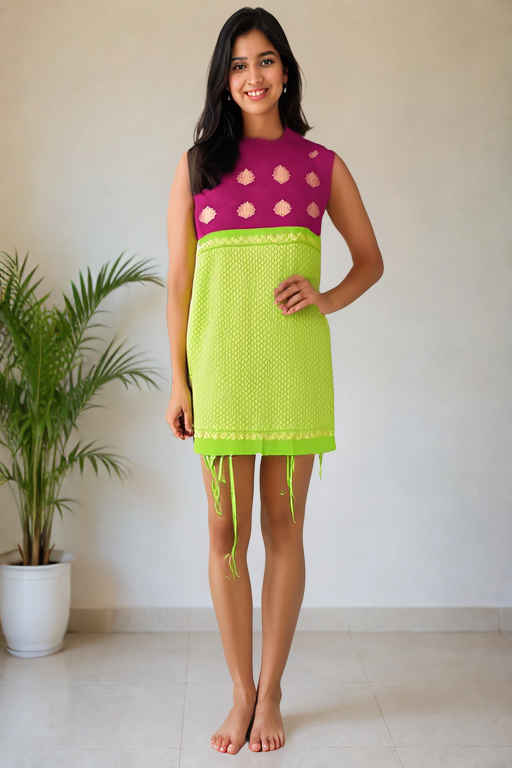

In [ ]:
from IPython.display import display
from PIL import Image
from io import BytesIO
import requests

result_url = "https://cdn.fashn.ai/01a00ed8-f719-7db0-a2b0-d5b03879adc6/output_0.png"

image_data = requests.get(result_url).content
result_image = Image.open(BytesIO(image_data))

print("✅ Try-on result loaded")
print("Size:", result_image.size)

display(result_image)!pip -q install gradio

import gradio as gr
import requests
import base64
import mimetypes
import time
from PIL import Image
from io import BytesIO
from google.colab import userdata

FASHN_API_KEY = userdata.get("FASHN_API_KEY")

def image_to_data_uri(filepath):
    mime = mimetypes.guess_type(filepath)[0] or "image/jpeg"
    with open(filepath, "rb") as f:
        data = base64.b64encode(f.read()).decode()
    return f"data:{mime};base64,{data}"

def try_on(person_file, garment_file):
    if not person_file or not garment_file:
        return None, "Please upload both images."

    headers = {
        "Authorization": f"Bearer {FASHN_API_KEY}",
        "Content-Type": "application/json"
    }

    payload = {
        "model_name": "tryon-v1.6",
        "inputs": {
            "model_image": image_to_data_uri(person_file),
            "garment_image": image_to_data_uri(garment_file),
            "category": "auto",
            "garment_photo_type": "auto",
            "mode": "balanced",
            "num_samples": 1,
            "output_format": "png"
        }
    }

    r = requests.post(
        "https://api.fashn.ai/v1/run",
        headers=headers,
        json=payload,
        timeout=120
    )

    if r.status_code != 200:
        return None, f"API Error: {r.text}"

    prediction_id = r.json()["id"]

    # Poll until finished
    for _ in range(30):
        time.sleep(2)

        s = requests.get(
            f"https://api.fashn.ai/v1/status/{prediction_id}",
            headers={"Authorization": f"Bearer {FASHN_API_KEY}"},
            timeout=60
        ).json()

        if s["status"] == "completed":
            result_url = s["output"][0]
            img = Image.open(
                BytesIO(requests.get(result_url).content)
            )
            return img, "✅ Try-on completed"

        if s["status"] in ["failed", "error"]:
            return None, f"❌ Try-on failed: {s}"

    return None, "⏳ Still processing. Please try again shortly."

with gr.Blocks(title="Virtual Try-On") as app:
    gr.Markdown("# 👗 Virtual Try-On")
    gr.Markdown("Upload a person photo and your garment/saree image.")

    with gr.Row():
        person = gr.Image(
            type="filepath",
            label="Person Photo"
        )
        garment = gr.Image(
            type="filepath",
            label="Saree / Garment"
        )

    try_button = gr.Button("✨ Try On", variant="primary")

    result = gr.Image(label="Try-On Result")
    status = gr.Textbox(label="Status")

    try_button.click(
        fn=try_on,
        inputs=[person, garment],
        outputs=[result, status]
    )

app.launch(share=True)

In [ ]:
!pip -q install gradio

import gradio as gr
import requests
import base64
import mimetypes
import time
from PIL import Image
from io import BytesIO
from google.colab import userdata

FASHN_API_KEY = userdata.get("FASHN_API_KEY")

def image_to_data_uri(filepath):
    mime = mimetypes.guess_type(filepath)[0] or "image/jpeg"
    with open(filepath, "rb") as f:
        data = base64.b64encode(f.read()).decode()
    return f"data:{mime};base64,{data}"

def try_on(person_file, garment_file):
    if not person_file or not garment_file:
        return None, "Please upload both images."

    headers = {
        "Authorization": f"Bearer {FASHN_API_KEY}",
        "Content-Type": "application/json"
    }

    payload = {
        "model_name": "tryon-v1.6",
        "inputs": {
            "model_image": image_to_data_uri(person_file),
            "garment_image": image_to_data_uri(garment_file),
            "category": "auto",
            "garment_photo_type": "auto",
            "mode": "balanced",
            "num_samples": 1,
            "output_format": "png"
        }
    }

    r = requests.post(
        "https://api.fashn.ai/v1/run",
        headers=headers,
        json=payload,
        timeout=120
    )

    if r.status_code != 200:
        return None, f"API Error: {r.text}"

    prediction_id = r.json()["id"]

    # Poll until finished
    for _ in range(30):
        time.sleep(2)

        s = requests.get(
            f"https://api.fashn.ai/v1/status/{prediction_id}",
            headers={"Authorization": f"Bearer {FASHN_API_KEY}"},
            timeout=60
        ).json()

        if s["status"] == "completed":
            result_url = s["output"][0]
            img = Image.open(
                BytesIO(requests.get(result_url).content)
            )
            return img, "✅ Try-on completed"

        if s["status"] in ["failed", "error"]:
            return None, f"❌ Try-on failed: {s}"

    return None, "⏳ Still processing. Please try again shortly."

with gr.Blocks(title="Virtual Try-On") as app:
    gr.Markdown("# 👗 Virtual Try-On")
    gr.Markdown("Upload a person photo and your garment/saree image.")

    with gr.Row():
        person = gr.Image(
            type="filepath",
            label="Person Photo"
        )
        garment = gr.Image(
            type="filepath",
            label="Saree / Garment"
        )

    try_button = gr.Button("✨ Try On", variant="primary")

    result = gr.Image(label="Try-On Result")
    status = gr.Textbox(label="Status")

    try_button.click(
        fn=try_on,
        inputs=[person, garment],
        outputs=[result, status]
    )

app.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://82da464b248d31a4e6.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
# Replace the current app with Try-On Max
import gradio as gr
import requests
import base64
import mimetypes
import time
from PIL import Image
from io import BytesIO
from google.colab import userdata

FASHN_API_KEY = userdata.get("FASHN_API_KEY")

def image_to_data_uri(filepath):
    mime = mimetypes.guess_type(filepath)[0] or "image/jpeg"
    with open(filepath, "rb") as f:
        data = base64.b64encode(f.read()).decode()
    return f"data:{mime};base64,{data}"

def try_on(person_file, garment_file):
    if not person_file or not garment_file:
        return None, "Upload both images."

    payload = {
        "model_name": "tryon-max",
        "inputs": {
            "model_image": image_to_data_uri(person_file),
            "product_image": image_to_data_uri(garment_file),
            "prompt": (
                "Dress the woman in the exact saree shown in the product image. "
                "Preserve the saree's original color, border, pattern and fabric. "
                "Create a realistic traditional Indian saree drape with natural "
                "waist pleats and the pallu draped over the shoulder. "
                "Keep the person's face, body, pose and background unchanged."
            )
        }
    }

    headers = {
        "Authorization": f"Bearer {FASHN_API_KEY}",
        "Content-Type": "application/json"
    }

    r = requests.post(
        "https://api.fashn.ai/v1/run",
        headers=headers,
        json=payload,
        timeout=120
    )

    if r.status_code != 200:
        return None, f"API Error: {r.text}"

    prediction_id = r.json()["id"]

    for _ in range(45):
        time.sleep(2)

        s = requests.get(
            f"https://api.fashn.ai/v1/status/{prediction_id}",
            headers={"Authorization": f"Bearer {FASHN_API_KEY}"},
            timeout=60
        ).json()

        if s["status"] == "completed":
            img = Image.open(
                BytesIO(requests.get(s["output"][0]).content)
            )
            return img, "✅ Try-On Max completed"

        if s["status"] in ["failed", "error"]:
            return None, f"❌ Failed: {s}"

    return None, "⏳ Processing timeout."

with gr.Blocks(title="Saree Virtual Try-On") as app:
    gr.Markdown("# 🇮🇳 Saree Virtual Try-On")

    with gr.Row():
        person = gr.Image(type="filepath", label="Person")
        garment = gr.Image(type="filepath", label="Saree")

    button = gr.Button("✨ Try Saree", variant="primary")
    result = gr.Image(label="Result")
    status = gr.Textbox(label="Status")

    button.click(
        try_on,
        inputs=[person, garment],
        outputs=[result, status]
    )

app.launch(share=True)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://72c5d948c5a0c0f393.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import requests
import base64
import mimetypes
import time
from PIL import Image
from io import BytesIO
from google.colab import userdata

FASHN_API_KEY = userdata.get("FASHN_API_KEY")


def image_to_data_uri(filepath):
    mime = mimetypes.guess_type(filepath)[0] or "image/jpeg"

    with open(filepath, "rb") as f:
        encoded = base64.b64encode(f.read()).decode()

    return f"data:{mime};base64,{encoded}"


def saree_tryon(person_file, saree_file):
    if not person_file or not saree_file:
        return None, "⚠️ Please upload both images."

    try:
        payload = {
            "model_name": "tryon-max",
            "inputs": {
                "model_image": image_to_data_uri(person_file),
                "product_image": image_to_data_uri(saree_file),
                "prompt": (
                    "Dress the woman in the exact saree shown in the product image. "
                    "Create a realistic traditional Indian saree drape. "
                    "Preserve the saree's exact colors, border, motifs, texture and design. "
                    "Create natural waist pleats and drape the pallu naturally over the shoulder. "
                    "Preserve the woman's face, hair, body proportions and pose. "
                    "Keep the original background unchanged."
                )
            }
        }

        headers = {
            "Authorization": f"Bearer {FASHN_API_KEY}",
            "Content-Type": "application/json"
        }

        response = requests.post(
            "https://api.fashn.ai/v1/run",
            headers=headers,
            json=payload,
            timeout=120
        )

        if response.status_code != 200:
            return None, f"❌ API Error: {response.text}"

        prediction_id = response.json()["id"]

        for _ in range(45):
            time.sleep(2)

            status = requests.get(
                f"https://api.fashn.ai/v1/status/{prediction_id}",
                headers={
                    "Authorization": f"Bearer {FASHN_API_KEY}"
                },
                timeout=60
            ).json()

            if status["status"] == "completed":
                result_url = status["output"][0]

                result = requests.get(
                    result_url,
                    timeout=60
                )

                image = Image.open(
                    BytesIO(result.content)
                )

                return image, "✅ Saree try-on completed"

            if status["status"] in ["failed", "error"]:
                return None, "❌ Generation failed"

        return None, "⏳ Generation is taking longer than expected."

    except Exception as e:
        return None, f"❌ Error: {str(e)}"


custom_css = """
#title {
    text-align: center;
    font-size: 32px;
    font-weight: 700;
}

#subtitle {
    text-align: center;
    font-size: 16px;
}

#try_button {
    font-size: 18px;
    font-weight: 600;
    min-height: 55px;
}

#result {
    min-height: 500px;
}
"""


with gr.Blocks(
    title="Saree Virtual Try-On",
    css=custom_css
) as app:

    gr.Markdown(
        "# ✨ Saree Virtual Try-On",
        elem_id="title"
    )

    gr.Markdown(
        "Upload your photo and a saree image to see the saree virtually draped.",
        elem_id="subtitle"
    )

    gr.Markdown("### 1. Upload Images")

    with gr.Row():

        with gr.Column():
            person = gr.Image(
                type="filepath",
                label="👩 Your Photo",
                height=420
            )

        with gr.Column():
            saree = gr.Image(
                type="filepath",
                label="🥻 Saree Image",
                height=420
            )

    gr.Markdown("### 2. Generate")

    try_button = gr.Button(
        "✨ Try Saree",
        variant="primary",
        elem_id="try_button"
    )

    status = gr.Markdown(
        "Ready — no API credit has been used yet."
    )

    gr.Markdown("### 3. Result")

    result = gr.Image(
        label="Your Saree Try-On",
        type="pil",
        elem_id="result"
    )

    try_button.click(
        fn=saree_tryon,
        inputs=[person, saree],
        outputs=[result, status]
    )


app.launch(share=True)

/tmp/ipykernel_805/952660261.py:118: UserWarning: The parameters have been moved from the Blocks constructor to the launch() method in Gradio 6.0: css. Please pass these parameters to launch() instead.
  with gr.Blocks(


Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://d9b716390555b20a77.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
import gradio as gr
import requests
import base64
import mimetypes
import time
from PIL import Image
from io import BytesIO
from google.colab import userdata

FASHN_API_KEY = userdata.get("FASHN_API_KEY")


def image_to_data_uri(filepath):
    mime = mimetypes.guess_type(filepath)[0] or "image/jpeg"
    with open(filepath, "rb") as f:
        encoded = base64.b64encode(f.read()).decode()
    return f"data:{mime};base64,{encoded}"


def saree_tryon(person_file, saree_file, progress=gr.Progress()):
    if not person_file or not saree_file:
        return None, "⚠️ Please upload both your photo and saree."

    try:
        progress(0.1, desc="Preparing images...")

        payload = {
            "model_name": "tryon-max",
            "inputs": {
                "model_image": image_to_data_uri(person_file),
                "product_image": image_to_data_uri(saree_file),
                "prompt": (
                    "Dress the woman in the exact saree shown in the product image. "
                    "Create a realistic traditional Indian saree drape with natural "
                    "waist pleats and the pallu over the shoulder. "
                    "Preserve the exact saree colors, border, motifs, texture and design. "
                    "Preserve the woman's face, hair, body proportions and pose. "
                    "Keep the original background unchanged."
                )
            }
        }

        headers = {
            "Authorization": f"Bearer {FASHN_API_KEY}",
            "Content-Type": "application/json"
        }

        progress(0.25, desc="Sending request...")

        response = requests.post(
            "https://api.fashn.ai/v1/run",
            headers=headers,
            json=payload,
            timeout=120
        )

        if response.status_code != 200:
            return None, f"❌ API Error: {response.text}"

        prediction_id = response.json()["id"]

        progress(0.4, desc="Creating your saree look...")

        for i in range(45):
            time.sleep(2)

            status = requests.get(
                f"https://api.fashn.ai/v1/status/{prediction_id}",
                headers={
                    "Authorization": f"Bearer {FASHN_API_KEY}"
                },
                timeout=60
            ).json()

            if status["status"] == "completed":
                progress(0.95, desc="Loading final image...")

                result_response = requests.get(
                    status["output"][0],
                    timeout=60
                )

                image = Image.open(
                    BytesIO(result_response.content)
                )

                progress(1.0, desc="Complete!")
                return image, "### ✅ Your saree look is ready!"

            if status["status"] in ["failed", "error"]:
                return None, "❌ Generation failed. Please try again."

            progress(
                min(0.9, 0.4 + i * 0.012),
                desc="AI is creating your look..."
            )

        return None, "⏳ Processing is taking longer than expected."

    except Exception as e:
        return None, f"❌ Error: {str(e)}"


css = """
body {
    background: #faf8f5;
}

#title {
    text-align: center;
    font-size: 36px;
    font-weight: 700;
    margin-bottom: 5px;
}

#subtitle {
    text-align: center;
    font-size: 17px;
    margin-bottom: 25px;
}

#try_button {
    min-height: 58px;
    font-size: 19px;
    font-weight: 700;
}

#result {
    min-height: 520px;
}

.instructions {
    text-align: center;
    font-size: 14px;
}
"""


with gr.Blocks(title="Saree Virtual Try-On") as app:

    gr.Markdown(
        "# ✨ Saree Virtual Try-On",
        elem_id="title"
    )

    gr.Markdown(
        "See how a saree looks on you before you buy.",
        elem_id="subtitle"
    )

    with gr.Row():

        with gr.Column():
            gr.Markdown("### 👩 Your Photo")

            person = gr.Image(
                type="filepath",
                label="Upload your photo",
                height=420
            )

            gr.Markdown(
                "Front-facing or 3/4 body photo works best.",
                elem_classes="instructions"
            )

        with gr.Column():
            gr.Markdown("### 🥻 Saree")

            saree = gr.Image(
                type="filepath",
                label="Upload saree image",
                height=420
            )

            gr.Markdown(
                "Use a clear product/flat-lay saree image.",
                elem_classes="instructions"
            )

    gr.Markdown("### ✨ Create Your Look")

    try_button = gr.Button(
        "✨ Try Saree",
        variant="primary",
        elem_id="try_button"
    )

    status = gr.Markdown(
        "Ready — upload both images to begin."
    )

    gr.Markdown("### Your Result")

    result = gr.Image(
        label="Saree Try-On Result",
        type="pil",
        elem_id="result"
    )

    try_button.click(
        fn=saree_tryon,
        inputs=[person, saree],
        outputs=[result, status]
    )

app.launch(share=True, css=css)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://4d6cdcf14d22243b3b.gradio.live

This share link is temporary and will last for up to 1 week (best effort). For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)


In [ ]:
# Save a backup of the current Colab notebook
from google.colab import drive

drive.mount('/content/drive')

print("✅ Google Drive connected")
print("Your notebook/app can now be backed up permanently.")

Mounted at /content/drive
✅ Google Drive connected
Your notebook/app can now be backed up permanently.
